# Figure 1 and 2 Notebook

# Import libraries we need and set some parameters

In [1]:
import anndata as ad
import math
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.stats as stats
import seaborn as sns
import statsmodels.api as sm
import warnings
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=150, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=10)
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.rcParams["image.aspect"] = "equal"
plt.rcParams["figure.figsize"] = ([3,3])
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E",
           "#D37295","#FABFD2","#B07AA1","#D4A6C8","#9D7660","#E58606", "#5D69B1", "#24796C",
           '#DAA51B', '#000000', '#99C945', '#ED645A']
colorrSS = ["#4E79A7","#A0CBE8","#8CD17D","#499894","#F28E2B","#FFBE7D","#B6992D","#E15759","#FF9D9A","#79706E",
           "#D37295","#FABFD2", '#B07AA1',"#B07AA1","#D4A6C8","#9D7660","#E58606", "#5D69B1", "#24796C","#499894",
           '#DAA51B', '#000000', '#99C945', '#ED645A']

# Figure 1

# Load entire dataset

In [2]:
adata = sc.read('Lupus_study_adjusted.h5ad', cache=False)
print(adata)

AnnData object with n_obs × n_vars = 1263676 × 1999
    obs: 'batch_cov', 'ind_cov', 'Processing_Cohort', 'louvain', 'cg_cov', 'ct_cov', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status'
    var: 'gene_ids'
    uns: 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [3]:
figdir = "./Lupus Revision Figure 1"
sc.settings.figdir = figdir

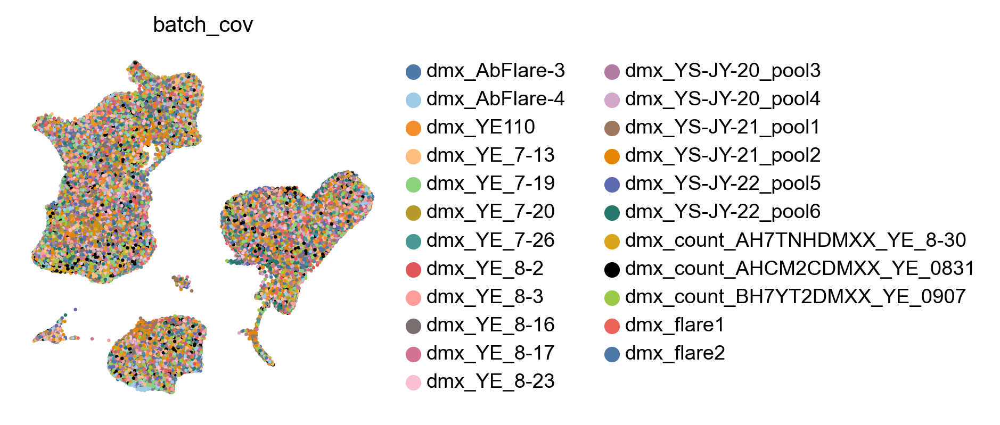

In [4]:
sc.pl.umap(adata, color=['batch_cov'], size=10, show=True, edgecolor="none", palette=colorrs, save="batch.png")

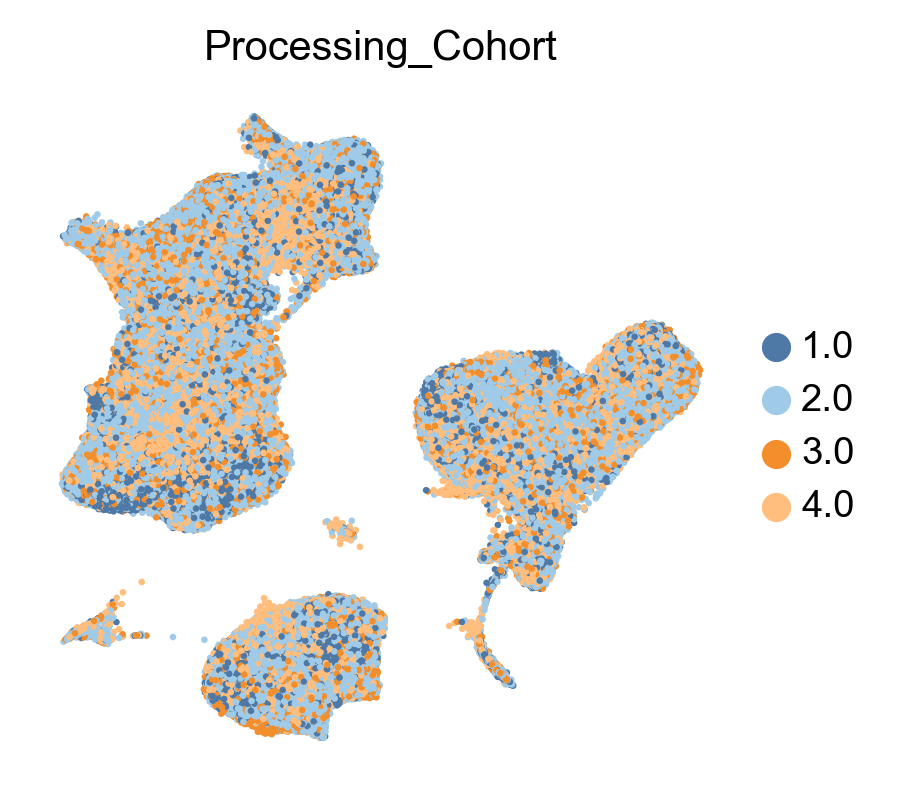

In [5]:
sc.pl.umap(adata, color=['Processing_Cohort'], size=10, show=True,
           edgecolor="none", palette=colorrs, save="processing_cohort.png")


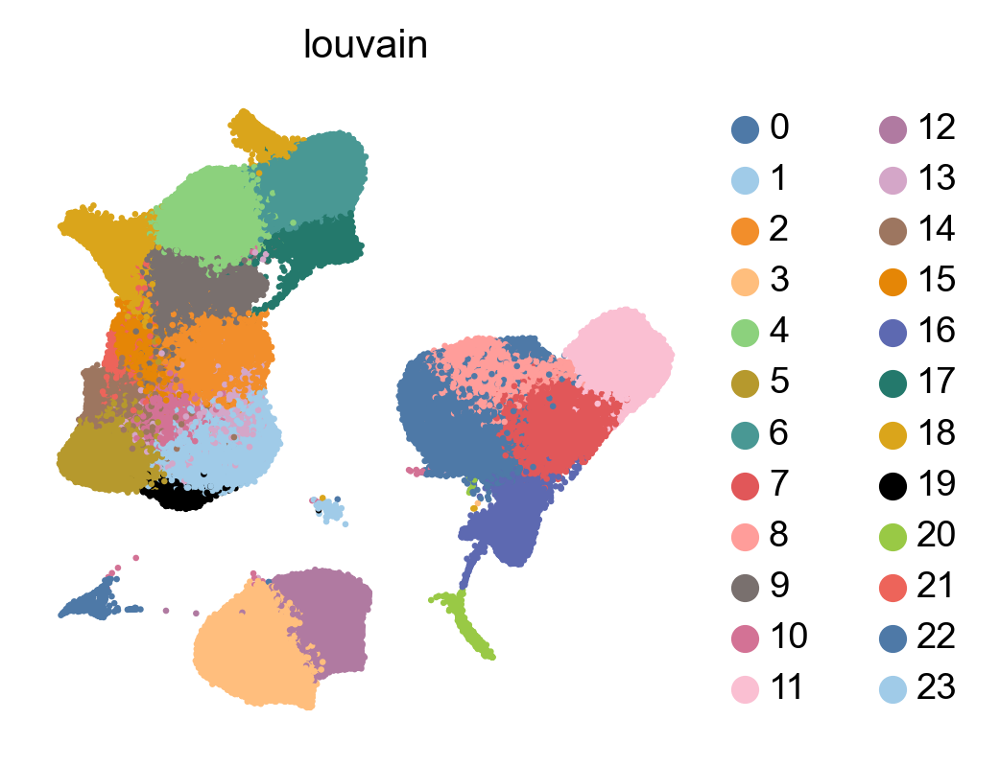

In [6]:
sc.pl.umap(adata, color=['louvain'], size=10, show=True, edgecolor="none", palette=colorrs)

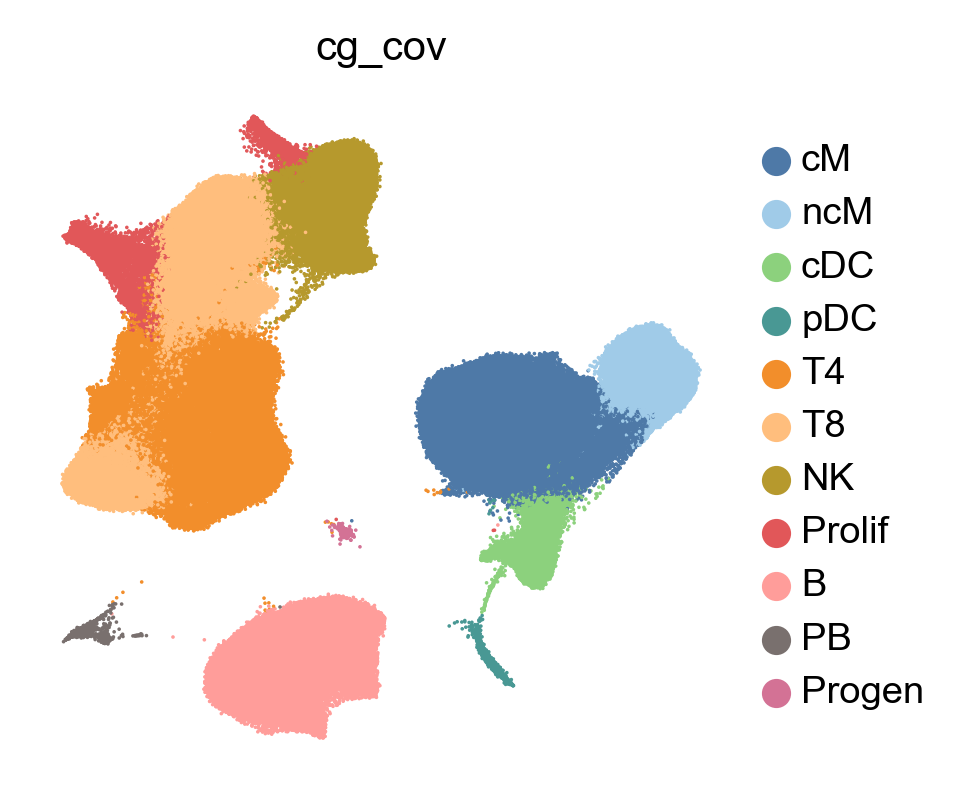

In [7]:
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC','T4','T8', 'NK','Prolif', 'B', 'PB', 'Progen']
adata.obs['cg_cov'] = adata.obs['cg_cov'].cat.reorder_categories(MasterORDER)
adata.uns['cg_cov_colors'] = colorrSS
cellgroups_umap = sc.pl.umap(adata, color='cg_cov', show=True, size=3, edgecolor="none", save='_cellgroups.png')

#### Keep only Europeans and Asian Ancestries for violin plots.
#### Sample size limitations for African American and Hispanic samples limited their use in this analysis.
#### Remove Immvar samples

In [8]:
immvar = adata.obs['ind_cov'][adata.obs['ind_cov'].str.contains("IGTB")].unique().tolist()
adata = adata[~adata.obs['ind_cov'].isin(immvar)] # Remove Immvar samples
adata = adata[~adata.obs['pop_cov'].isin(['African American','Hispanic'])] # Retain only European and Asian Ancestry samples
adata.obs['pop_cov_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['pop_cov'] + row['SLE_status'], axis=1), ordered=True)
adata.obs['ind_cov_pop_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov'] + row['pop_cov'], axis=1), ordered=True)


Trying to set attribute `.obs` of view, copying.


## Figure 1C

In [2]:
def formatter(x, pos):
    'The two args are the value and tick position'
    if ((x > 0.9) or (x == 0)) :
        return '%1.0f' % x
    else :
        res = '%1.1f' % x
        return res


def get_proportion_stats(ind_perc, group1, group2, covar, ct_name):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}; Pval = {}
    for ct_i in list(range(len(ind_perc0[ct_name].cat.categories))):
        ct = ind_perc0[ct_name].cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0[ct_name]==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0[ct_name]==ct]
        disease = ind_perc0[covar][ind_perc0[ct_name]==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        Effect[ct]=est.params[1]
        Pval[ct]=est.pvalues[1]
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(Effect[ct]),
                                   "Pval":str(Pval[ct])}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.05/len(p)) # Bonferroni
        return ['background-color: yellow' if v else '' for v in sig]
    p_out = all_out.set_index('Cell')['Pval'].to_dict()
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)
    return Effect, p_out

def Fishers_method(Euro_Pval, Asian_Pval):
    combined_p = pd.DataFrame(index=list(Euro_Pval.keys()), columns=['Combined P', 'Significant'])
    for c in list(Euro_Pval.keys()):
        _, p = stats.combine_pvalues(pvalues=[Euro_Pval[c], Asian_Pval[c]], method='fisher')
        combined_p.loc[c, 'Combined P'] = p
    combined_p['Significant'] = combined_p['Combined P']<(0.05/len(combined_p))
    return combined_p


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Cell,Pval
0,9.170828093295896,cM,0.000475
1,1.2056171732553356,ncM,0.043662
2,0.12988233930182805,cDC,0.449511
3,-0.0974238997233574,pDC,0.112103
4,-11.083605316867919,T4,0.000021
5,3.606026793799759,T8,0.074772
6,-1.9023190464604145,NK,0.089650
7,0.33187049440338523,Prolif,0.021086
8,-1.0359746623280053,B,0.520579
9,-0.025719531141305374,PB,0.594136


['AsianHealthy'] versus ['AsianSLE']


,Beta,Cell,Pval
0,11.604125900151917,cM,0.000116
1,1.6913512209105503,ncM,0.017231
2,0.01820364754790585,cDC,0.928721
3,-0.08792162939525229,pDC,0.065582
4,-19.450535295012166,T4,0.000000
5,4.449435588021554,T8,0.054564
6,-0.48584871510822375,NK,0.614563
7,0.5009338128867227,Prolif,0.009640
8,1.8669436096666592,B,0.410916
9,-0.029842511892547524,PB,0.485740


,Combined P,Significant
cM,9.75011e-07,True
ncM,0.00616347,False
cDC,0.782148,False
pDC,0.0434706,False
T4,5.57818e-16,True
T8,0.0265259,False
NK,0.2148,False
Prolif,0.00193135,True
B,0.543809,False
PB,0.647242,False


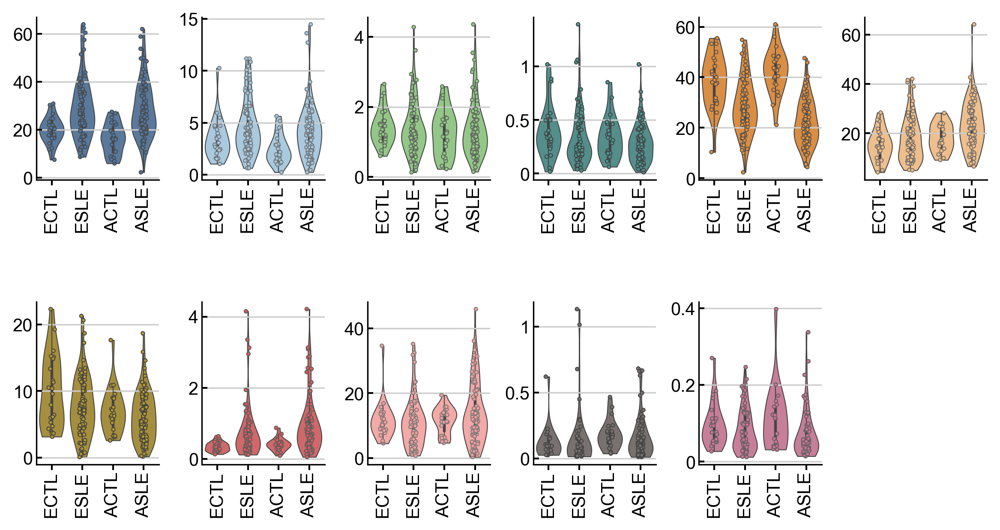

In [10]:
colorrs_desat = sns.color_palette(colorrSS, desat=1)
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov','pop_cov_SLE_status','cg_cov'],
                                    observed=True)['cg_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")

# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()), dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc['ind_cov_pop_cov']==ind_count_sums['ind_cov_pop_cov'][ii]] = ind_count_sums.counts[ii]

ind_perc['cg_cov'] = ind_perc['cg_cov'].astype('category')
ind_perc['pop_cov_SLE_status'] = ind_perc['pop_cov_SLE_status'].astype('category')

perc_plot = sns.catplot(x='pop_cov_SLE_status', y='ct_perc',
                        hue='cg_cov', data=ind_perc, kind='violin', col_order=MasterORDER,
                        order=['EuropeanHealthy', 'EuropeanSLE', 'AsianHealthy','AsianSLE'],
                        col='cg_cov', col_wrap=6, cut=0, dodge=False,
                        height=2, aspect=0.7,  linewidth=0.5, sharex=False, sharey=False, palette=colorrSS)

perc_plot.set_yticklabels(size=10)
perc_plot.set_xticklabels(size=10)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.stripplot(x="pop_cov_SLE_status", y="ct_perc", data=ind_perc[ind_perc.cg_cov == ct],
                  order=['EuropeanHealthy', 'EuropeanSLE', 'AsianHealthy', 'AsianSLE'], 
                  color=colorrs_desat[ct_i], jitter=True, size=2, linewidth=0.5, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[ct_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[ct_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.35, hspace = 0.75)
perc_plot.set_xticklabels(["ECTL", "ESLE", "ACTL", "ASLE"])
perc_plot.savefig(figdir+"/Figure1C.png")
perc_plot.savefig(figdir+"/Figure1C.pdf")

Euro_effect, Euro_Pval  = get_proportion_stats(ind_perc, group1=['EuropeanHealthy'], group2=['EuropeanSLE'], covar='pop_cov_SLE_status',ct_name='cg_cov')
Asian_effect, Asian_Pval = get_proportion_stats(ind_perc, group1=['AsianHealthy'], group2=['AsianSLE'], covar='pop_cov_SLE_status',ct_name='cg_cov')

Fish_results = Fishers_method(Euro_Pval, Asian_Pval)
display(Fish_results)

## Generate excel sheet summarizing data

In [11]:
# Generate excel sheet summarizing data
tmp = pd.DataFrame.from_dict(Asian_Pval, orient='index', columns=['P value'])
tmpE = pd.DataFrame.from_dict(Euro_Pval, orient='index', columns=['P value'])

Adiffs = []; Ediffs = []
for ct in tmp.index.tolist():
    Adiffs.append(np.round(ind_perc[(ind_perc['cg_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='AsianSLE')]['ct_perc'].mean() - ind_perc[(ind_perc['cg_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='AsianHealthy')]['ct_perc'].mean(),3))
    Ediffs.append(np.round(ind_perc[(ind_perc['cg_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='EuropeanSLE')]['ct_perc'].mean() - ind_perc[(ind_perc['cg_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='EuropeanHealthy')]['ct_perc'].mean(),3))

tmp['Case/Control % change'] = pd.DataFrame(Adiffs, index=tmp.index.tolist())
tmp['Ethnicity'] = 'Asian'
tmpE['Case/Control % change'] = pd.DataFrame(Ediffs, index=tmp.index.tolist())
tmpE['Ethnicity'] = 'European'

summary = pd.concat([tmp,tmpE])
summary['Fischers Method P'] = Fish_results['Combined P']
summary['Significant?'] = Fish_results['Significant']
summary_main = pd.concat([tmp,tmpE])
summary.to_csv('Table1.csv')
display(summary)


,P value,Case/Control % change,Ethnicity,Fischers Method P,Significant?
cM,1.158600e-04,11.916,Asian,9.75011e-07,True
ncM,1.723128e-02,1.759,Asian,0.00616347,False
cDC,9.287207e-01,0.118,Asian,0.782148,False
pDC,6.558194e-02,-0.052,Asian,0.0434706,False
T4,6.679423e-13,-20.444,Asian,5.57818e-16,True
T8,5.456386e-02,4.687,Asian,0.0265259,False
NK,6.145631e-01,-0.815,Asian,0.2148,False
Prolif,9.640454e-03,0.551,Asian,0.00193135,True
B,4.109165e-01,2.343,Asian,0.543809,False
PB,4.857404e-01,-0.021,Asian,0.647242,False


(0.9647438204626195, 1.6140019655517612e-06)

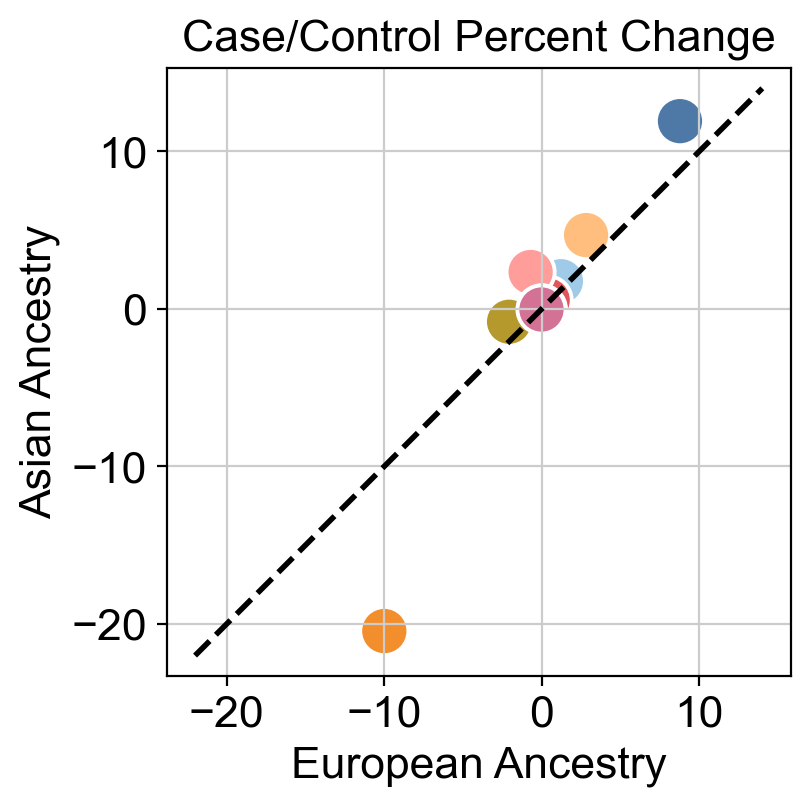

In [12]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
tmp_Frame = pd.DataFrame(index=tmp.index.tolist(), columns=['Asian', 'European'])
tmp_Frame['Asian'] = tmp['Case/Control % change']
tmp_Frame['European'] = tmpE['Case/Control % change']
tmp_Frame = tmp_Frame.reset_index()
ax = sns.scatterplot(x='European',y='Asian', data=tmp_Frame, hue='index', palette=colorrSS[:11], s=300, alpha=1)
plt.plot([-22, 14], [-22, 14], 'k--', lw=2)
ax.get_legend().remove()
plt.xlabel('European Ancestry')
plt.ylabel('Asian Ancestry')
plt.title('Case/Control Percent Change')
plt.axis('equal')
plt.savefig(figdir+"/Asian_vs_Euro_PercentChange.png")
plt.savefig(figdir+"/Asian_vs_Euro_PercentChange.pdf")
stats.pearsonr(tmp_Frame['Asian'],tmp_Frame['European'])

# Plot individual variability

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


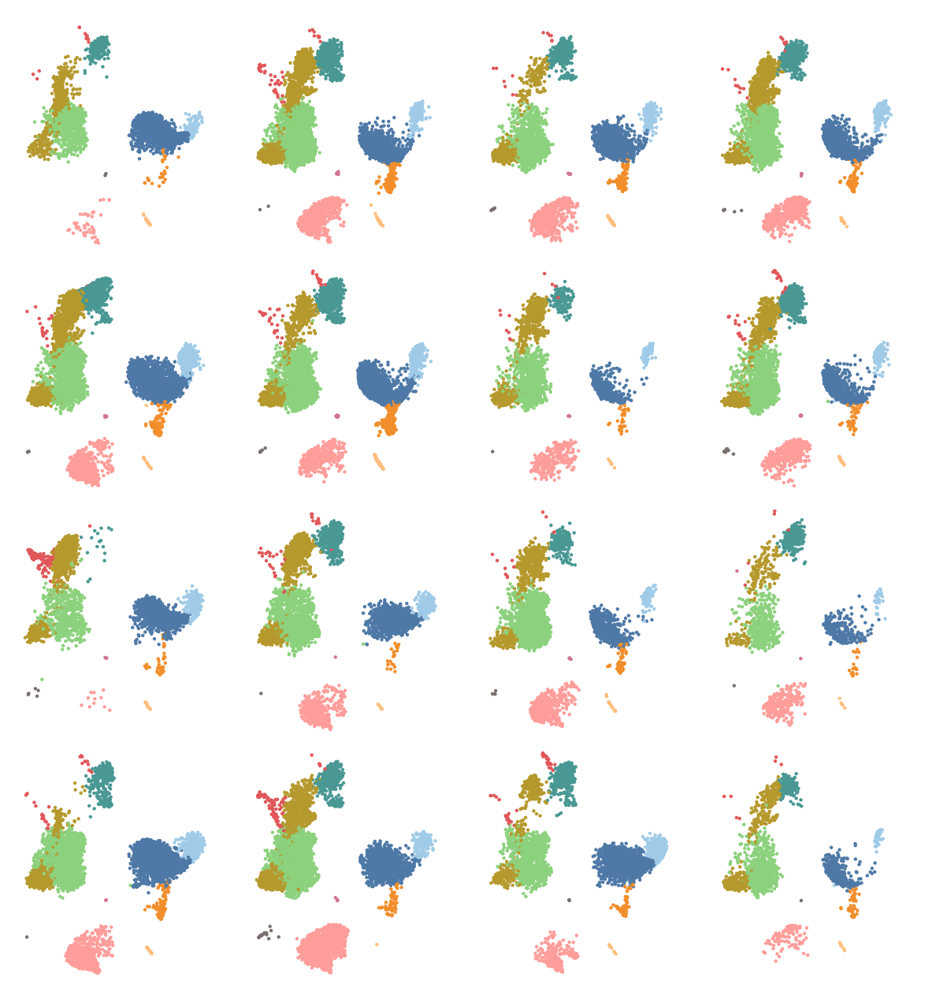

In [13]:
fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7), sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

batch_name = 'dmx_YS-JY-22_pool6'
batch = adata.obs.ind_cov[adata.obs.batch_cov==batch_name].unique();
batch = np.sort(batch.categories.values)
for ind_i in list(range(16)):
    ind = batch[ind_i]
    col = colorrs[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "cg_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=10, edgecolor="none", palette=colorrs)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
fig.savefig(figdir+'/'+'individual_umaps.png')    

# Medication effects

In [14]:
Ref = pd.read_excel('Master_V3.xlsx')
Flare = {}; Managed = {}
for f in Ref['Genotype_ID'][Ref['Status']=='Flare'].values:
    Flare[f] = Ref['Batch'][(Ref['Genotype_ID']==f) & (Ref['Status']=='Flare')].values[0]
for m in Ref['Genotype_ID'][Ref['Status']=='Treated'].values:
    Managed[m] = Ref['Batch'][(Ref['Genotype_ID']==m) & (Ref['Status']=='Treated')].values[0]    
adata.obs['Status'] = adata.obs['Status'].astype('object')
adata.obs['Flare'] = adata.obs['Status']

for f in Flare.keys():
    adata.obs['Flare'][(adata.obs['ind_cov']==f) & (adata.obs['batch_cov']==Flare[f])] = 'Flare'
for m in Managed.keys():
    adata.obs['Flare'][(adata.obs['ind_cov']==m) & (adata.obs['batch_cov']==Managed[m])] = 'Managed'


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


### Switch Sample ID nomenclature for a few patients to match ind_cov convention

In [15]:
adata.obs['ind_cov'] = adata.obs['ind_cov'].astype('object')
adata.obs['ind_cov'][adata.obs['ind_cov']=='1130_1130'] = 'FLARE003'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1772_1772'] = 'FLARE018'
adata.obs['ind_cov'][adata.obs['ind_cov']=='2132_2132'] = 'FLARE019'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1763_1763'] = 'FLARE008'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1586_1586'] = 'FLARE002'
adata.obs['ind_cov_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov'] +'-'+ row['Flare'],
                                                                 axis=1), ordered=True)


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing t

### Collect Medication information

In [16]:
med_info = pd.read_excel('Perez_meds_revision.xlsx', header=2)

for ii in range(len(med_info['Sample ID'].tolist())):
    if len(med_info['Sample ID'][ii].split('-'))>1:
        if med_info['Sample ID'][ii].split('-')[1]=='01':
            med_info['Sample ID'][ii] = 'FLARE'+med_info['Sample ID'][ii].split('-')[0]+'-Flare'
        elif med_info['Sample ID'][ii].split('-')[1]=='02':
            med_info['Sample ID'][ii] = 'FLARE'+med_info['Sample ID'][ii].split('-')[0]+'-Managed'
    else:
        med_info['Sample ID'][ii] = med_info['Sample ID'][ii]+'_'+med_info['Sample ID'][ii]+'-Managed'

med_info = med_info[med_info['Sample ID'].isin(adata.obs['ind_cov_SLE_status'].unique().tolist())]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


### Preallocate space for medications prescribed to >= 5 patients

In [17]:
adata.obs['No_Meds'] = np.repeat('error', len(adata))
adata.obs['Prednisone'] = np.repeat('error', len(adata))
adata.obs['Azathioprine'] = np.repeat('error', len(adata))
adata.obs['Methotrexate'] = np.repeat('error', len(adata))
adata.obs['Calcineurin inhibitor'] = np.repeat('error', len(adata))
adata.obs['Hydroxychloroquine'] = np.repeat('error', len(adata))
adata.obs['Mycophenolate'] = np.repeat('error', len(adata))

rx_dict = {'No_Meds':'no_SLE_meds','Prednisone':'prednisone',
          'Azathioprine':'rx_azathioprine', 'Methotrexate':'rx_methotrexate',
           'Calcineurin inhibitor':'rx_calcineur_inh',
          'Hydroxychloroquine':'rx_hydroxychloroquine','Mycophenolate':'rx_MMF'}


In [18]:
for med in list(rx_dict.keys()):
    for item in med_info['Sample ID'].tolist():
        if np.isnan(med_info[rx_dict[med]][med_info['Sample ID']==item].tolist()[0]) == False:
            adata.obs[med][adata.obs['ind_cov_SLE_status']==item] = med_info[rx_dict[med]][med_info['Sample ID']==item].tolist()[0]
        else:
            adata.obs[med][adata.obs['ind_cov_SLE_status']==item] = 0.0
    
    adata.obs[med][adata.obs['SLE_status']=='Healthy'] = -1
    

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


## On vs. Off Therapy

### Asian Ancestry

In [19]:
adata.obs['cg_cov'] = adata.obs['cg_cov'].cat.reorder_categories(MasterORDER)

adata_obs_small = adata[adata.obs['pop_cov']=='Asian'].obs
ind_count = adata_obs_small.groupby(['ind_cov_SLE_status','SLE_status','No_Meds','Prednisone',
                                     'Azathioprine','Methotrexate','Calcineurin inhibitor',
                                     'Hydroxychloroquine','Mycophenolate','cg_cov'],
                                     observed=True)['cg_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_SLE_status==ind_count_sums.ind_cov_SLE_status[ii]] = ind_count_sums.counts[ii]

ind_perc.cg_cov = ind_perc.cg_cov.astype('category')
ind_perc = ind_perc.set_index('ind_cov_SLE_status')

# Remove columns without data
ind_perc = ind_perc[ind_perc['No_Meds']!='error'] 
ind_perc['No_Meds'].loc[ind_perc['SLE_status']=='Healthy'] = -1
ind_perc_A = ind_perc.copy() # Store a copy


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


[0] versus [1]


,Beta,Cell,Pval
0,-4.667882533336774,cM,0.376940
1,-0.34185654474603594,ncM,0.788600
2,-0.02925329031888986,cDC,0.934320
3,0.16696716010053644,pDC,0.036852
4,5.391800460667332,T4,0.189106
5,-5.2451518636603245,T8,0.207550
6,-0.5233947375521105,NK,0.760324
7,-0.24854424501446135,Prolif,0.530964
8,5.395258402268387,B,0.199924
9,0.0653260775483642,PB,0.483686


[-1] versus [1]


,Beta,Cell,Pval
0,3.6809232104809118,cM,0.027648
1,0.6904973151752318,ncM,0.020503
2,0.0036336731881847772,cDC,0.977643
3,0.03621855538253776,pDC,0.480237
4,-7.282666714195402,T4,0.000471
5,-0.22097119424826794,T8,0.883675
6,-0.5220010402201711,NK,0.439279
7,0.1353486142897971,Prolif,0.006652
8,3.4893325221579925,B,0.043488
9,0.014223002799433199,PB,0.599458


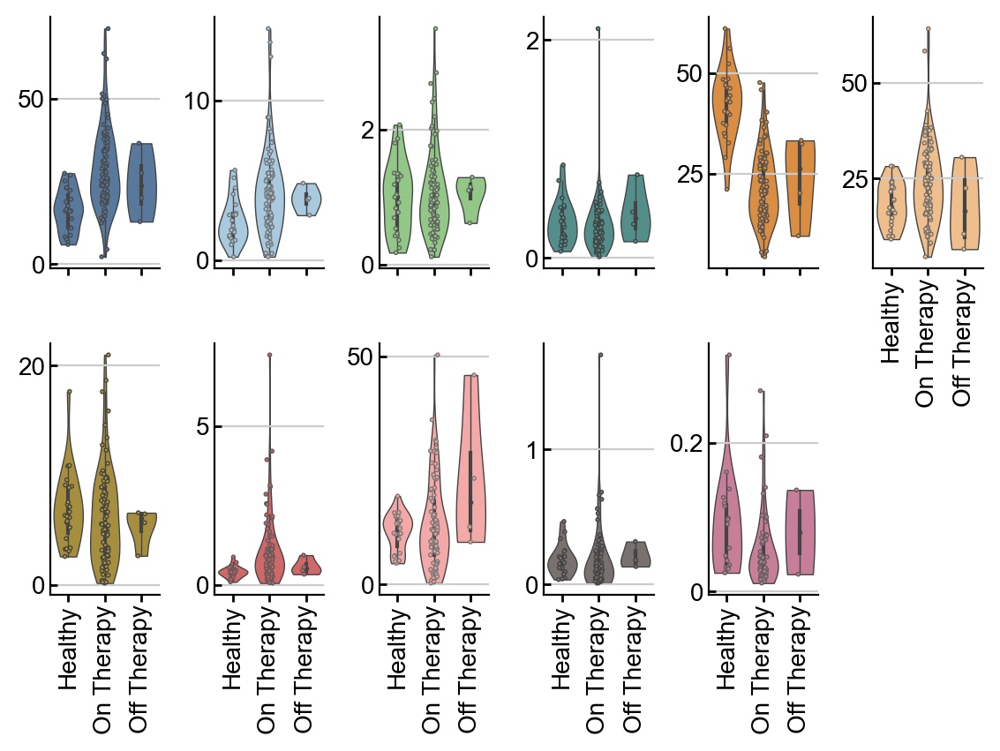

In [20]:
perc_plot = sns.catplot(x='No_Meds', y='ct_perc', 
                        hue='cg_cov', data=ind_perc, kind='violin', col_order=MasterORDER, 
                        col='cg_cov', col_wrap=6, cut=0, dodge=False, height=2,
                        aspect=0.5,  linewidth=0.5, sharex=True, 
                        sharey=False, palette=colorrSS)
perc_plot.set_yticklabels(size=10)
perc_plot.set_xticklabels(size=10)

for cg_i in list(range(len(MasterORDER))):
    cg = MasterORDER[cg_i]
    sns.stripplot(x="No_Meds", y="ct_perc", data=ind_perc[ind_perc.cg_cov == cg], 
                  linewidth=0.5, color=colorrs_desat[cg_i], size=1.5, ax=perc_plot.axes[cg_i])#
    perc_plot.axes[cg_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[cg_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[cg_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[cg_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[cg_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
    
perc_plot.set_xticklabels(rotation=90)
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.fig.subplots_adjust(hspace = 0.3, wspace = 0.5)
perc_plot.set_xticklabels(["Healthy",'On Therapy',"Off Therapy"])
perc_plot.savefig(figdir+"/violin.nomeds.Asian.png")

_,_ = get_proportion_stats(ind_perc, group1=[0], group2=[1], covar='No_Meds', ct_name='cg_cov') # No Meds vs. Meds

Asian_effect_nomeds, Asian_Pval_nomeds = get_proportion_stats(ind_perc, group1=[-1], group2=[1],
                                            covar='No_Meds', ct_name='cg_cov') # Healthy vs. No meds


### European Ancestry

In [21]:
adata.obs['cg_cov'] = adata.obs['cg_cov'].cat.reorder_categories(MasterORDER)

adata_obs_small = adata[adata.obs['pop_cov']=='European'].obs
ind_count = adata_obs_small.groupby(['ind_cov_SLE_status','SLE_status','No_Meds','Prednisone',
                                     'Azathioprine','Methotrexate','Calcineurin inhibitor',
                                     'Hydroxychloroquine','Mycophenolate','cg_cov'],observed=True)['cg_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_SLE_status==ind_count_sums.ind_cov_SLE_status[ii]] = ind_count_sums.counts[ii]

ind_perc.cg_cov = ind_perc.cg_cov.astype('category')
ind_perc = ind_perc.set_index('ind_cov_SLE_status')

# Remove columns without data
ind_perc = ind_perc[ind_perc['No_Meds']!='error']
ind_perc['No_Meds'].loc[ind_perc['SLE_status']=='Healthy'] = -1
ind_perc_E = ind_perc.copy() # Store a copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


[0] versus [1]


,Beta,Cell,Pval
0,-2.059049705328179,cM,0.530792
1,0.6076114701098162,ncM,0.410946
2,0.3556319284962837,cDC,0.099725
3,0.082487577065065,pDC,0.240993
4,1.121910988906497,T4,0.699640
5,-3.7895393482356323,T8,0.128930
6,-0.2180419243665571,NK,0.865196
7,-0.17001195866473948,Prolif,0.367793
8,3.740751559541231,B,0.052722
9,-0.01182734790323908,PB,0.848513


[-1] versus [1]


,Beta,Cell,Pval
0,3.7914773990361152,cM,0.003746
1,0.8370938554005258,ncM,0.025286
2,0.20206715566448089,cDC,0.061739
3,-0.016906058903731896,pDC,0.740561
4,-5.109211717503115,T4,0.002727
5,0.3418276089386314,T8,0.747370
6,-1.035233003351867,NK,0.126182
7,0.10038135398244588,Prolif,0.056193
8,0.9125493350558034,B,0.422994
9,-0.017300980920357867,PB,0.539216


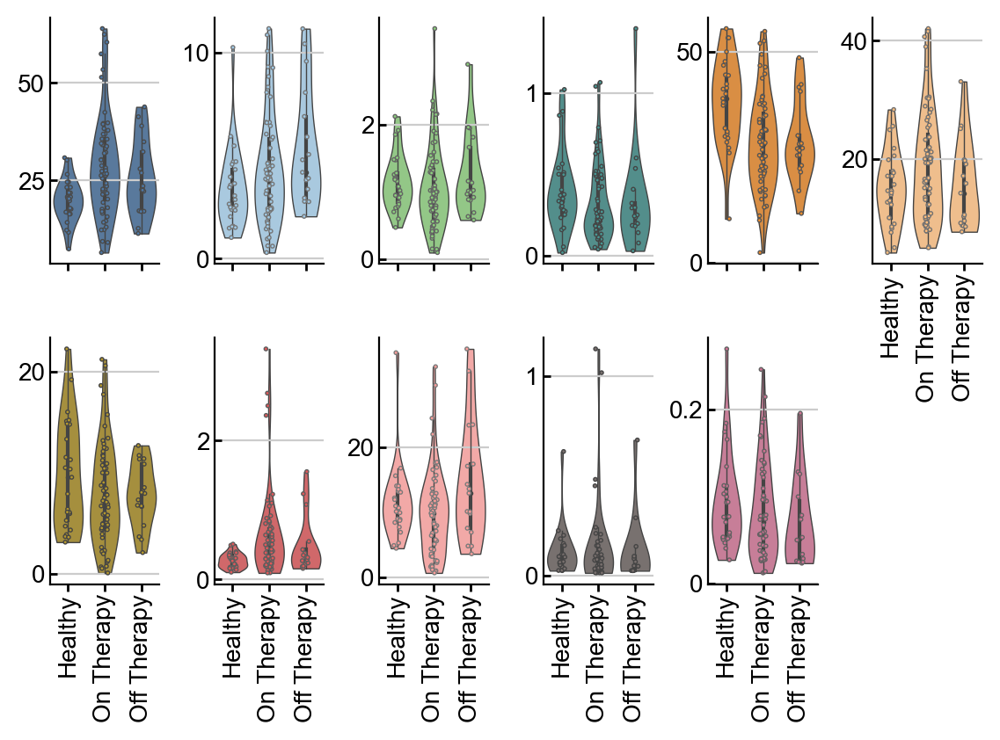

In [22]:
perc_plot = sns.catplot(x='No_Meds', y='ct_perc', 
                        hue='cg_cov', data=ind_perc, kind='violin', col_order=MasterORDER, 
                        col='cg_cov', col_wrap=6, cut=0, dodge=False, height=2,
                        aspect=0.5,  linewidth=0.5, sharex=True, 
                        sharey=False, palette=colorrSS)
perc_plot.set_yticklabels(size=10)
perc_plot.set_xticklabels(size=10)

for cg_i in list(range(len(MasterORDER))):
    cg = MasterORDER[cg_i]
    sns.stripplot(x="No_Meds", y="ct_perc", data=ind_perc[ind_perc.cg_cov == cg], 
                  linewidth=0.5, color=colorrs_desat[cg_i], size=1.5, ax=perc_plot.axes[cg_i])#
    perc_plot.axes[cg_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[cg_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[cg_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[cg_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[cg_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
    
perc_plot.set_xticklabels(rotation=90)
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.fig.subplots_adjust(hspace = 0.3, wspace = 0.5)
perc_plot.set_xticklabels(["Healthy",'On Therapy',"Off Therapy"])
perc_plot.savefig(figdir+"/violin.nomeds.EUR.png")

_,_ = get_proportion_stats(ind_perc, group1=[0], group2=[1], covar='No_Meds', ct_name='cg_cov') # No Meds vs. Meds

Euro_effect_nomeds, Euro_Pval_nomeds = get_proportion_stats(ind_perc, group1=[-1], group2=[1], covar='No_Meds', ct_name='cg_cov') # Healthy vs. No meds


In [23]:
adata.obs['cg_cov'] = adata.obs['cg_cov'].cat.reorder_categories(MasterORDER)

adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_SLE_status', 'pop_cov','SLE_status','Prednisone',
                                     'Azathioprine','Methotrexate','Calcineurin inhibitor',
                                     'Hydroxychloroquine','Mycophenolate','cg_cov'],observed=True)['cg_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_SLE_status==ind_count_sums.ind_cov_SLE_status[ii]] = ind_count_sums.counts[ii]

ind_perc.cg_cov = ind_perc.cg_cov.astype('category')
ind_perc = ind_perc.set_index('ind_cov_SLE_status')
ind_perc = ind_perc[ind_perc['Prednisone']!='error']
ind_perc = ind_perc[ind_perc['SLE_status']=='SLE'] # Keep only cases


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


### Individual medications

 
Prednisone


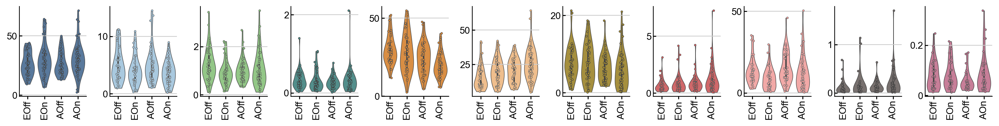

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,3.7832676853798644,cM,0.169171
1,-1.1273192780238313,ncM,0.067507
2,-0.40145726423165085,cDC,0.026158
3,-0.07540768947604726,pDC,0.202569
4,-2.5219028771202443,T4,0.301456
5,4.717257402486499,T8,0.023432
6,-0.26195963533606725,NK,0.808555
7,0.13493284485560247,Prolif,0.395998
8,-4.461793974736388,B,0.005867
9,0.0522102038801413,PB,0.335126


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,4.656211078271313,cM,0.061979
1,-1.633228394763996,ncM,0.005954
2,0.1993164665315283,cDC,0.239280
3,0.010128950854743381,pDC,0.793864
4,-4.5815978237224115,T4,0.017728
5,4.523060513880767,T8,0.020975
6,-0.5518285538785207,NK,0.498689
7,0.11517801481940279,Prolif,0.541818
8,-2.719460705544527,B,0.174340
9,0.01658672977107938,PB,0.704393


Fisher:


,Combined P,Significant
cM,0.0582737,False
ncM,0.00354475,True
cDC,0.0380158,False
pDC,0.454699,False
T4,0.0333038,False
T8,0.00423558,True
NK,0.769452,False
Prolif,0.544801,False
B,0.00806499,False
PB,0.576854,False


 
Azathioprine


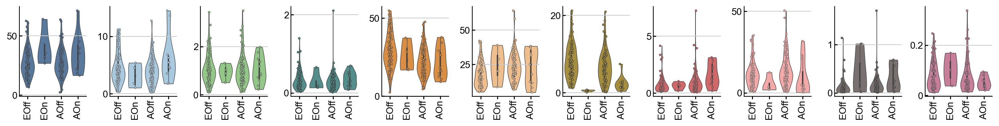

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,10.177614268834937,cM,0.114268
1,-1.2429879306500815,ncM,0.394468
2,-0.2505256614499992,cDC,0.560330
3,-0.02887985885887727,pDC,0.836117
4,-3.6428802997695304,T4,0.525664
5,8.11835027553459,T8,0.099204
6,-7.608405111543075,NK,0.001967
7,-0.038990810049147735,Prolif,0.916956
8,-6.100270628635391,B,0.110049
9,0.3696289411141843,PB,0.001335


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,7.017942756796727,cM,0.086670
1,3.5031549035580176,ncM,0.000254
2,-0.014091221089098438,cDC,0.959437
3,0.06285733703771988,pDC,0.318777
4,-2.483848947321472,T4,0.439587
5,-1.203794201033653,T8,0.711981
6,-3.932246032973775,NK,0.002576
7,0.6320735382628826,Prolif,0.038908
8,-3.6700295627655666,B,0.264307
9,0.12407230110010117,PB,0.103384


Fisher:


,Combined P,Significant
cM,0.0556072,False
ncM,0.00102292,True
cDC,0.871257,False
pDC,0.618961,False
T4,0.569603,False
T8,0.257824,False
NK,6.68433e-05,True
Prolif,0.154598,False
B,0.13198,False
PB,0.00136451,True


 
Methotrexate


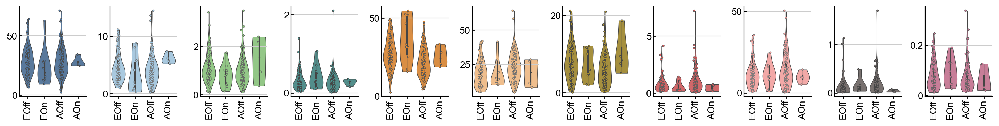

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,-4.416977533044494,cM,0.330380
1,-1.5814211254154134,ncM,0.119866
2,-0.5301256822364553,cDC,0.075779
3,0.07657543911508206,pDC,0.432754
4,7.387937787867858,T4,0.063442
5,-0.15511351157157732,T8,0.964457
6,-0.5527023824308701,NK,0.755796
7,-0.2094197790285141,Prolif,0.423054
8,-0.3276776568579476,B,0.903410
9,0.032725368741653216,PB,0.742395


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,-2.191063544897691,cM,0.717163
1,2.0456798147487114,ncM,0.157974
2,0.47978571060211106,cDC,0.234851
3,0.0008665325029925883,pDC,0.992532
4,4.269383150729106,T4,0.364077
5,-4.789835547823893,T8,0.314651
6,4.174413461227875,NK,0.030982
7,-0.4714633019417878,Prolif,0.297350
8,-3.413176660279752,B,0.479398
9,-0.11943533010621432,PB,0.316896


Fisher:


,Combined P,Significant
cM,0.578116,False
ncM,0.0940484,False
cDC,0.089495,False
pDC,0.792504,False
T4,0.11013,False
T8,0.665347,False
NK,0.111328,False
Prolif,0.386581,False
B,0.795507,False
PB,0.5757,False


 
Calcineurin inhibitor


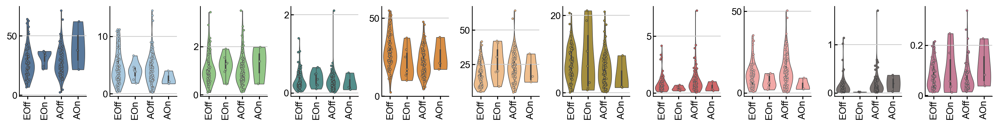

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,5.5236411852499225,cM,0.196188
1,-0.9195802318870498,ncM,0.340497
2,0.17706089750118292,cDC,0.533644
3,0.022601411512451715,pDC,0.806604
4,-8.733350866948522,T4,0.019290
5,7.3303019355623595,T8,0.023248
6,1.1808142415381293,NK,0.480953
7,-0.3131746767133894,Prolif,0.202938
8,-3.2783321965129772,B,0.226604
9,-0.10283524245393369,PB,0.333823


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,18.18530819970635,cM,0.005154
1,-1.9166947419569726,ncM,0.229367
2,0.2875031625187807,cDC,0.518313
3,0.049443600758265586,pDC,0.626675
4,0.9684981033862559,T4,0.851704
5,-4.414657100554755,T8,0.399423
6,-2.7874007091341317,NK,0.193670
7,-0.45616122952515603,Prolif,0.359165
8,-9.942891925124655,B,0.058529
9,-0.026938195129073292,PB,0.827162


Fisher:


,Combined P,Significant
cM,0.00798447,False
ncM,0.277234,False
cDC,0.632075,False
pDC,0.850341,False
T4,0.0839321,False
T8,0.0527363,False
NK,0.314236,False
Prolif,0.26377,False
B,0.0705961,False
PB,0.631471,False


 
Hydroxychloroquine


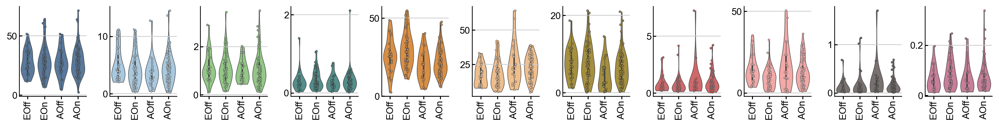

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,-0.42340802695440116,cM,0.882664
1,-0.599220107021872,ncM,0.352221
2,-0.15502022015639905,cDC,0.413857
3,-0.0172867280322966,pDC,0.779090
4,3.3327591748028254,T4,0.186477
5,2.2246639823282255,T8,0.308856
6,-0.14416713214588178,NK,0.897604
7,-0.07322673225200028,Prolif,0.657161
8,-3.798792026631338,B,0.024006
9,0.016462152807237913,PB,0.765718


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,1.7654694796897197,cM,0.549854
1,0.2779559059354801,ncM,0.696032
2,0.12625198191238682,cDC,0.528919
3,-0.028011637495491376,pDC,0.538739
4,0.1888797610922604,T4,0.934636
5,-1.983064671306894,T8,0.394445
6,0.9374490448743303,NK,0.326408
7,-0.13470543190087692,Prolif,0.542963
8,-1.0920264066213534,B,0.643438
9,-0.08437975364960838,PB,0.092161


Fisher:


,Combined P,Significant
cM,0.836192,False
ncM,0.589813,False
cDC,0.551435,False
pDC,0.784112,False
T4,0.478777,False
T8,0.37829,False
NK,0.652663,False
Prolif,0.724525,False
B,0.0798641,False
PB,0.257659,False


 
Mycophenolate


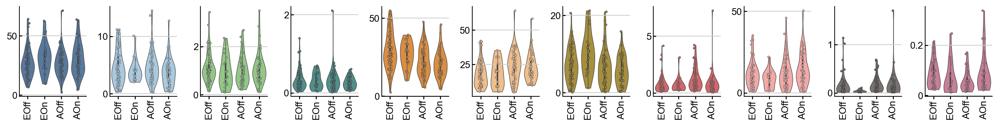

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,4.106432681498213,cM,0.182228
1,-0.4121138648496625,ncM,0.554054
2,-0.16075836119928485,cDC,0.432530
3,-0.051370925052284355,pDC,0.439182
4,-3.7417585589731117,T4,0.169223
5,0.7701056562753139,T8,0.744934
6,2.81480197220103,NK,0.017708
7,-0.027383134606570103,Prolif,0.877871
8,-2.367410621019674,B,0.211515
9,-0.0987929477824442,PB,0.109548


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,4.527860251492732,cM,0.069903
1,-1.2950032483313607,ncM,0.030689
2,0.16560109797619219,cDC,0.329459
3,-0.02709431172818191,pDC,0.484504
4,-0.9022535223445249,T4,0.645950
5,-1.6443600410743362,T8,0.407984
6,-0.9325031228513494,NK,0.252131
7,-0.4639791247061836,Prolif,0.012511
8,0.5830399286379602,B,0.772178
9,-0.01724624658534589,PB,0.694138


Fisher:


,Combined P,Significant
cM,0.0683173,False
ncM,0.0862814,False
cDC,0.420151,False
pDC,0.542064,False
T4,0.351275,False
T8,0.665887,False
NK,0.0286263,False
Prolif,0.0605331,False
B,0.459276,False
PB,0.271961,False


In [25]:
meds = ['Prednisone', 'Azathioprine','Methotrexate', 'Calcineurin inhibitor','Hydroxychloroquine','Mycophenolate']
for m in meds:
    print(' ')
    print(m)
    ind_perc[m] = ind_perc[m].astype('category')
    ind_perc['pop_{}'.format(m)] = ind_perc['pop_cov'].astype('str')+ind_perc[m].astype('str')
    ind_perc['pop_{}'.format(m)] = ind_perc['pop_{}'.format(m)].astype('category')
    
    perc_plot = sns.catplot(x='pop_{}'.format(m), y='ct_perc',
                        hue='cg_cov', data=ind_perc, kind='violin', col_order=MasterORDER,
                        order=['European0.0', 'European1.0', 'Asian0.0','Asian1.0'],
                        col='cg_cov', col_wrap=11, cut=0, dodge=False,
                        height=2, aspect=0.7,  linewidth=0.5, sharex=False, sharey=False, palette=colorrSS)

    perc_plot.set_yticklabels(size=10)
    perc_plot.set_xticklabels(size=10)

    for ct_i in list(range(len(MasterORDER))):
        ct = MasterORDER[ct_i]
        sns.stripplot(x='pop_{}'.format(m), y="ct_perc", data=ind_perc[ind_perc.cg_cov == ct],
                      order=['European0.0', 'European1.0', 'Asian0.0','Asian1.0'], 
                      color=colorrs_desat[ct_i], jitter=True, size=2, linewidth=0.5, ax=perc_plot.axes[ct_i])
        perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
        perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
        perc_plot.axes[ct_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
        perc_plot.axes[ct_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
        perc_plot.axes[ct_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
    perc_plot.set_titles('')
    perc_plot.fig.tight_layout()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.35, hspace = 0.75)
    perc_plot.set_xticklabels(["EOff", "EOn", "AOff", "AOn"])
    perc_plot.savefig(figdir+"/violin.{}.png".format(m))
    plt.show()
    
    _,Med_Euro_Pval = get_proportion_stats(ind_perc, group1=['European0.0'], group2=['European1.0'],
                                           covar='pop_{}'.format(m), ct_name='cg_cov') # Off vs On Euro
    _,Med_Asian_Pval = get_proportion_stats(ind_perc, group1=['Asian0.0'], group2=['Asian1.0'],
                                            covar='pop_{}'.format(m), ct_name='cg_cov') # Off vs On Asian
    
    Fish_results = Fishers_method(Med_Euro_Pval, Med_Asian_Pval)
    print('Fisher:')
    display(Fish_results)

    

## Matrix plot showing cell type markers

In [26]:
adata.obs['cg_cov'] = adata.obs['cg_cov'].astype('str')
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC','Progen', 'Prolif', 'T8', 'T4', 'NK','B', 'PB']
adata.obs['cg_cov'] = adata.obs['cg_cov'].astype('category')
adata.obs['cg_cov'] = adata.obs['cg_cov'].cat.reorder_categories(MasterORDER)

... storing 'ind_cov' as categorical
... storing 'Status' as categorical
... storing 'Flare' as categorical
... storing 'No_Meds' as categorical
... storing 'Prednisone' as categorical
... storing 'Azathioprine' as categorical
... storing 'Methotrexate' as categorical
... storing 'Calcineurin inhibitor' as categorical
... storing 'Hydroxychloroquine' as categorical
... storing 'Mycophenolate' as categorical


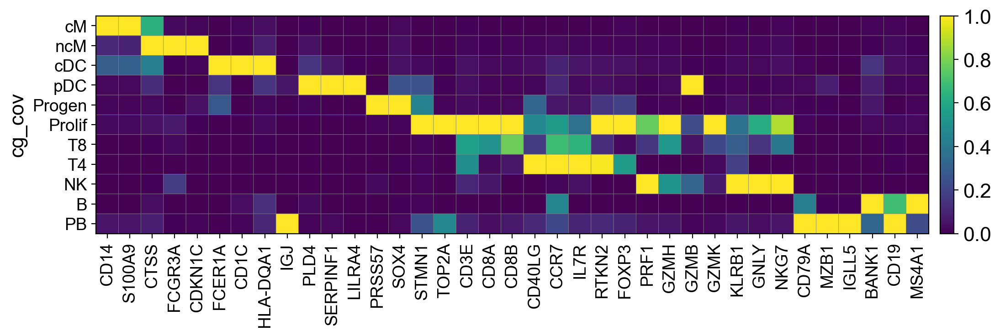

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[11.84, 0, 0.2])

In [27]:
sc.pl.matrixplot(adata, var_names=['CD14', 'S100A9', 'CTSS', 'FCGR3A', 'CDKN1C','FCER1A','CD1C', 'HLA-DQA1',
                                   'IGJ', 'PLD4', 'SERPINF1', 'LILRA4', 'PRSS57', 'SOX4', 'STMN1', 'TOP2A',
                                   'CD3E', 'CD8A', 'CD8B', 'CD40LG', 'CCR7', 'IL7R','RTKN2', 'FOXP3',
                                   'PRF1','GZMH', 'GZMB', 'GZMK','KLRB1','GNLY','NKG7',
                                   'CD79A', 'MZB1', 'IGLL5', 'BANK1','CD19', 'MS4A1'],
              groupby="cg_cov", save="Figure1_cg_marker_heatmap.png", show=True, standard_scale="var",
                 use_raw=True, log=False)



# Figure 2

In [3]:
figdir = "./Lupus Revision Figure 2"
sc.settings.figdir = figdir

## Load Lymphocyte Data

In [4]:
adata = sc.read("Lupus_study_lymphocytes.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 793873 × 2000
    obs: 'louvain', 'ct_cov', 'batch_cov', 'ind_cov', 'Processing_Cohort', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status', 'Dominant Signal', 'cytotoxic_score', 'exhaustion_score', 'Type 1 Interferon Score', 'mait', 'tc_expanded', 'th_expanded'
    var: 'gene_ids'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


### Label Flare cohort

In [5]:
Ref = pd.read_excel('Master_V3.xlsx')
Flare = {}
for f in Ref['Genotype_ID'][Ref['Status']=='Flare'].values:
    Flare[f] = Ref['Batch'][(Ref['Genotype_ID']==f) & (Ref['Status']=='Flare')].values[0]
adata.obs['SLE_status'] = adata.obs['SLE_status'].astype('object')
adata.obs['Flare'] = adata.obs['SLE_status']

for f in Flare.keys():
    adata.obs['Flare'][(adata.obs['ind_cov']==f) & (adata.obs['batch_cov']==Flare[f])] = 'Flare'

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


## Annotate clusters and plot

... storing 'SLE_status' as categorical
... storing 'Flare' as categorical


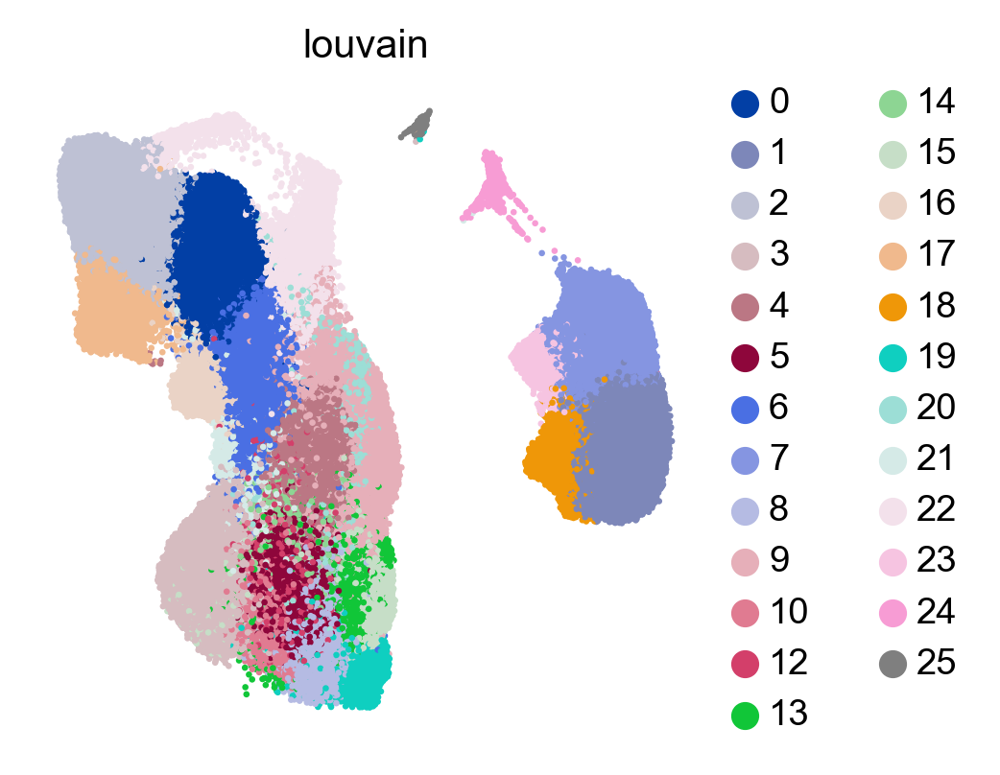

In [6]:
sc.pl.umap(adata, color=['louvain'], size=10,show=True, save='louvain.png', edgecolor="none")

# Figure 2A

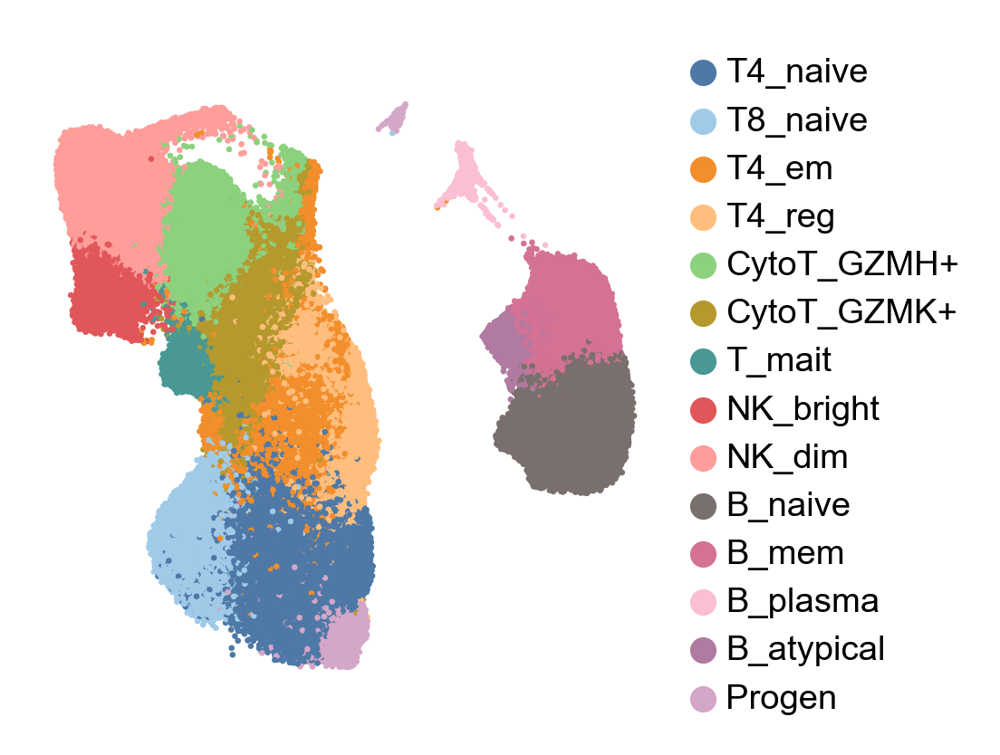

In [7]:
#plot UMAP of cell types colored by clusters
MasterORDER = ['T4_naive', 'T8_naive', 'T4_em', 'T4_reg', 'CytoT_GZMH+', 'CytoT_GZMK+','T_mait',
               'NK_bright', 'NK_dim', 'B_naive', 'B_mem', 'B_plasma', 'B_atypical',
               'Progen']
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
sc.pl.umap(adata, color='ct_cov', size=10, show=True, edgecolor="none", 
           save="Fig2A.png", palette=colorrs, title=" ")

In [8]:
immvar = adata.obs['ind_cov'][adata.obs['ind_cov'].str.contains("IGTB")].unique().tolist()
adata = adata[~adata.obs['ind_cov'].isin(immvar)] # Remove Immvar samples
adata = adata[~adata.obs['pop_cov'].isin(['African American','Hispanic'])] # Retain only European and Asian Ancestries
adata.obs['pop_cov_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['pop_cov'] + row['SLE_status'], axis=1), ordered=True)
adata.obs['ind_cov_pop_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov'] + row['pop_cov'], axis=1), ordered=True)

Trying to set attribute `.obs` of view, copying.


# Figure 2C

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Cell,Pval
0,-13.632085077762014,T4_naive,0.000001
1,0.1889969874169659,T8_naive,0.840632
2,3.1153510709576215,T4_em,0.014481
3,1.0354349889733665,T4_reg,0.050804
4,6.61816686327374,CytoT_GZMH+,0.004192
5,1.581153074628552,CytoT_GZMK+,0.171935
6,-0.6579826481894262,T_mait,0.037800
7,0.1427522798438407,NK_bright,0.776439
8,-1.4378520383756268,NK_dim,0.334393
9,2.960563351266379,B_naive,0.099002


['AsianHealthy'] versus ['AsianSLE']


,Beta,Cell,Pval
0,-21.04492504448262,T4_naive,0.000000
1,2.386215262405469,T8_naive,0.157518
2,1.7161089132755216,T4_em,0.223277
3,1.0239327369579607,T4_reg,0.014211
4,7.226420168083672,CytoT_GZMH+,0.007181
5,1.4038479674005409,CytoT_GZMK+,0.196706
6,-1.1861749494372253,T_mait,0.000012
7,0.388753311014153,NK_bright,0.079133
8,0.3765297377468839,NK_dim,0.784879
9,5.621262535033838,B_naive,0.030223


,Combined P,Significant
T4_naive,8.63383e-21,True
T8_naive,0.400132,False
T4_em,0.0217731,False
T4_reg,0.00594446,False
CytoT_GZMH+,0.000343527,True
CytoT_GZMK+,0.14836,False
T_mait,6.93031e-06,True
NK_bright,0.232845,False
NK_dim,0.613539,False
B_naive,0.0203819,False


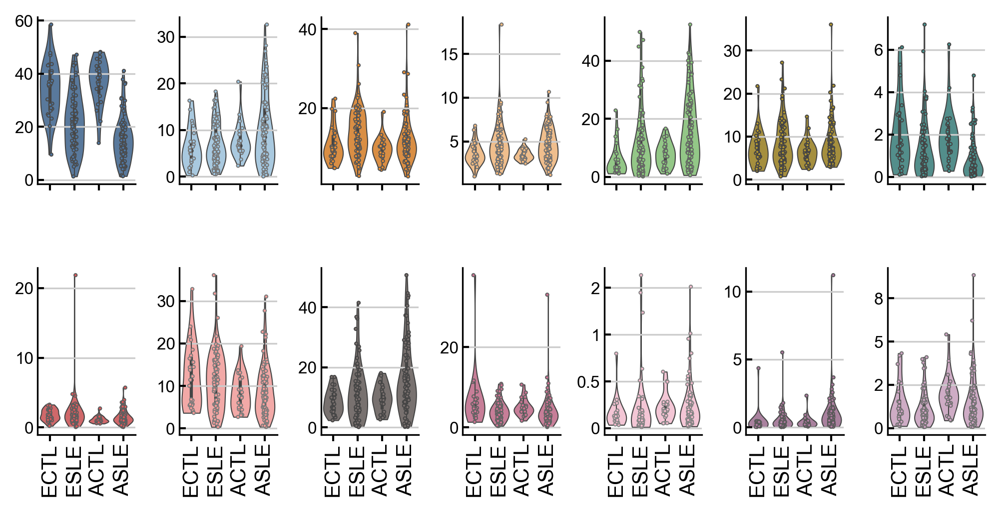

In [9]:
colorrs_desat = sns.color_palette(colorrs, desat=1)
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov','ct_cov','Age','pop_cov_SLE_status',
                                     'SLE_status', 'ind_cov'],observed=True)['ct_cov'].count()

ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")

# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()), dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc['ind_cov_pop_cov']==ind_count_sums['ind_cov_pop_cov'][ii]] = ind_count_sums.counts[ii]

ind_perc['ct_cov'] = ind_perc['ct_cov'].astype('category')
ind_perc['pop_cov_SLE_status'] = ind_perc['pop_cov_SLE_status'].astype('category')

perc_plot = sns.catplot(x='pop_cov_SLE_status', y='ct_perc', order=['EuropeanHealthy', 'EuropeanSLE', 'AsianHealthy',
                                                                    'AsianSLE'], hue='ct_cov', data=ind_perc, 
                        kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=7, cut=0, dodge=False,
                        height=1.75, aspect=0.6,  linewidth=0.5, sharex=True, sharey=False, palette=colorrs)
perc_plot.set_yticklabels(size=8)
perc_plot.set_xticklabels(size=10)
for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.stripplot(x="pop_cov_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct],
                  order=['EuropeanHealthy', 'EuropeanSLE', 'AsianHealthy', 'AsianSLE'], 
                  color=colorrs_desat[ct_i], size=1.5, linewidth=0.5, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[ct_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[ct_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.45, hspace = 0.5)
perc_plot.set_xticklabels(["ECTL", "ESLE", "ACTL", "ASLE"])
perc_plot.savefig(figdir+"/Figure2C.png")
perc_plot.savefig(figdir+"/Figure2C.pdf")



Euro_effect,Euro_Pval  = get_proportion_stats(ind_perc, group1=['EuropeanHealthy'], group2=['EuropeanSLE'], covar='pop_cov_SLE_status',ct_name='ct_cov')
Asian_effect,Asian_Pval = get_proportion_stats(ind_perc, group1=['AsianHealthy'], group2=['AsianSLE'], covar='pop_cov_SLE_status',ct_name='ct_cov')
Fish_results = Fishers_method(Euro_Pval, Asian_Pval)
display(Fish_results)

# Generate excel sheet summarizing data

In [10]:
# Generate excel sheet summarizing data
tmp = pd.DataFrame.from_dict(Asian_Pval, orient='index', columns=['P value'])
tmpE = pd.DataFrame.from_dict(Euro_Pval, orient='index', columns=['P value'])

Adiffs = []; Ediffs = []
for ct in tmp.index.tolist():
    Adiffs.append(np.round(ind_perc[(ind_perc['ct_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='AsianSLE')]['ct_perc'].mean() - ind_perc[(ind_perc['ct_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='AsianHealthy')]['ct_perc'].mean(),3))
    Ediffs.append(np.round(ind_perc[(ind_perc['ct_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='EuropeanSLE')]['ct_perc'].mean() - ind_perc[(ind_perc['ct_cov']==ct) & (ind_perc['pop_cov_SLE_status']=='EuropeanHealthy')]['ct_perc'].mean(),3))

tmp['Case/Control % change'] = pd.DataFrame(Adiffs, index=tmp.index.tolist())
tmp['Ethnicity'] = 'Asian'
tmpE['Case/Control % change'] = pd.DataFrame(Ediffs, index=tmp.index.tolist())
tmpE['Ethnicity'] = 'European'

summary = pd.concat([tmp,tmpE])
summary['Fischers Method P'] = Fish_results['Combined P']
summary['Significant?'] = Fish_results['Significant']
summary.to_csv('Table2.csv')
display(summary)

,P value,Case/Control % change,Ethnicity,Fischers Method P,Significant?
T4_naive,1.503963e-16,-21.917,Asian,8.63383e-21,True
T8_naive,1.575175e-01,2.141,Asian,0.400132,False
T4_em,2.232769e-01,2.321,Asian,0.0217731,False
T4_reg,1.421128e-02,1.141,Asian,0.00594446,False
CytoT_GZMH+,7.181305e-03,8.368,Asian,0.000343527,True
CytoT_GZMK+,1.967058e-01,1.858,Asian,0.14836,False
T_mait,1.173117e-05,-1.100,Asian,6.93031e-06,True
NK_bright,7.913336e-02,0.384,Asian,0.232845,False
NK_dim,7.848794e-01,0.377,Asian,0.613539,False
B_naive,3.022325e-02,6.040,Asian,0.0203819,False


### T4 and T8 Naive populations vs age

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


SpearmanrResult(correlation=0.021280932036987815, pvalue=0.760287747888285)

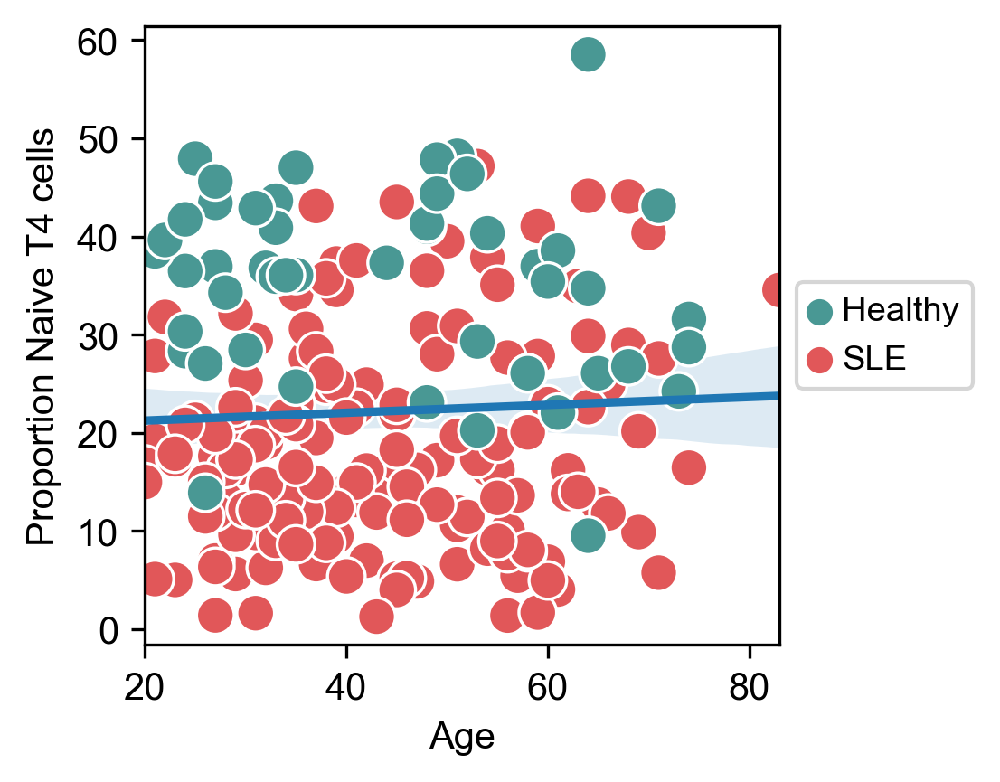

In [11]:
df = ind_perc[ind_perc['ct_cov']=='T4_naive']
df['Age'] = df['Age'].astype(float)
sns.regplot(x='Age',y='ct_perc',data=df, scatter=False)
ax = sns.scatterplot(x='Age',y='ct_perc', hue='SLE_status', data=df, palette=["#499894","#E15759"], s=100)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Proportion Naive T4 cells')
plt.xlabel('Age')
plt.grid(False)
plt.savefig(figdir+'/'+'{}.png'.format('T4_vs_Age'), bbox_inches='tight')
stats.spearmanr(df['Age'], df['ct_perc'])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


SpearmanrResult(correlation=-0.5859996468014418, pvalue=1.4287879418654712e-20)

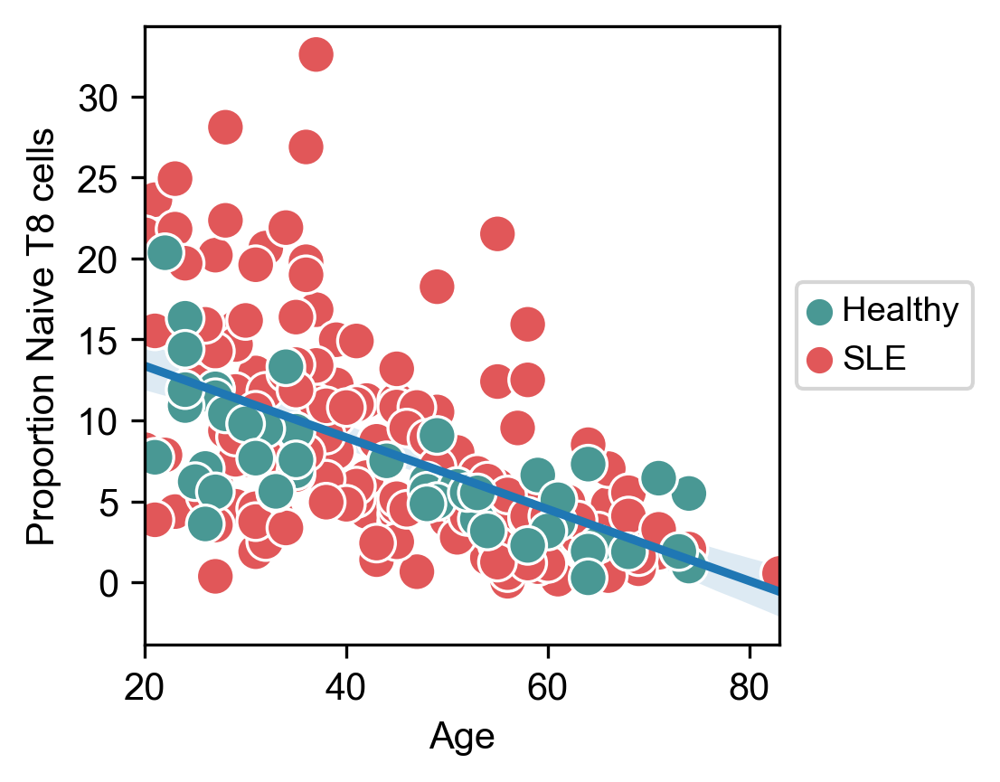

In [12]:
df = ind_perc[ind_perc['ct_cov']=='T8_naive']
df['Age'] = df['Age'].astype(float)
sns.regplot(x='Age',y='ct_perc',data=df, scatter=False)
ax = sns.scatterplot(x='Age',y='ct_perc', hue='SLE_status', data=df, palette=["#499894","#E15759"],s=100)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Proportion Naive T8 cells')
plt.xlabel('Age')
plt.grid(False)
plt.savefig(figdir+'/'+'{}.png'.format('T8_vs_Age'), bbox_inches='tight')
stats.spearmanr(df['Age'], df['ct_perc'])

# Medication effects

In [13]:
Ref = pd.read_excel('Master_V3.xlsx')
Flare = {}; Managed = {}
for f in Ref['Genotype_ID'][Ref['Status']=='Flare'].values:
    Flare[f] = Ref['Batch'][(Ref['Genotype_ID']==f) & (Ref['Status']=='Flare')].values[0]
for m in Ref['Genotype_ID'][Ref['Status']=='Treated'].values:
    Managed[m] = Ref['Batch'][(Ref['Genotype_ID']==m) & (Ref['Status']=='Treated')].values[0]    
adata.obs['Status'] = adata.obs['Status'].astype('object')
adata.obs['Flare'] = adata.obs['Status']

for f in Flare.keys():
    adata.obs['Flare'][(adata.obs['ind_cov']==f) & (adata.obs['batch_cov']==Flare[f])] = 'Flare'
for m in Managed.keys():
    adata.obs['Flare'][(adata.obs['ind_cov']==m) & (adata.obs['batch_cov']==Managed[m])] = 'Managed'

adata.obs['ind_cov'] = adata.obs['ind_cov'].astype('object')
adata.obs['ind_cov'][adata.obs['ind_cov']=='1130_1130'] = 'FLARE003'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1772_1772'] = 'FLARE018'
adata.obs['ind_cov'][adata.obs['ind_cov']=='2132_2132'] = 'FLARE019'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1763_1763'] = 'FLARE008'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1586_1586'] = 'FLARE002'
adata.obs['ind_cov_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov'] +'-'+ row['Flare'],
                                                                 axis=1), ordered=True)
med_info = pd.read_excel('Perez_meds_revision.xlsx', header=2)

for ii in range(len(med_info['Sample ID'].tolist())):
    if len(med_info['Sample ID'][ii].split('-'))>1:
        if med_info['Sample ID'][ii].split('-')[1]=='01':
            med_info['Sample ID'][ii] = 'FLARE'+med_info['Sample ID'][ii].split('-')[0]+'-Flare'
        elif med_info['Sample ID'][ii].split('-')[1]=='02':
            med_info['Sample ID'][ii] = 'FLARE'+med_info['Sample ID'][ii].split('-')[0]+'-Managed'
    else:
        med_info['Sample ID'][ii] = med_info['Sample ID'][ii]+'_'+med_info['Sample ID'][ii]+'-Managed'

med_info = med_info[med_info['Sample ID'].isin(adata.obs['ind_cov_SLE_status'].unique().tolist())]

adata.obs['No_Meds'] = np.repeat('error', len(adata))
adata.obs['Prednisone'] = np.repeat('error', len(adata))
adata.obs['Azathioprine'] = np.repeat('error', len(adata))
adata.obs['Methotrexate'] = np.repeat('error', len(adata))
adata.obs['Calcineurin inhibitor'] = np.repeat('error', len(adata))
adata.obs['Hydroxychloroquine'] = np.repeat('error', len(adata))
adata.obs['Mycophenolate'] = np.repeat('error', len(adata))

rx_dict = {'No_Meds':'no_SLE_meds','Prednisone':'prednisone',
          'Azathioprine':'rx_azathioprine', 'Methotrexate':'rx_methotrexate',
           'Calcineurin inhibitor':'rx_calcineur_inh',
          'Hydroxychloroquine':'rx_hydroxychloroquine','Mycophenolate':'rx_MMF'}

for med in list(rx_dict.keys()):
    for item in med_info['Sample ID'].tolist():
        if np.isnan(med_info[rx_dict[med]][med_info['Sample ID']==item].tolist()[0]) == False:
            adata.obs[med][adata.obs['ind_cov_SLE_status']==item] = med_info[rx_dict[med]][med_info['Sample ID']==item].tolist()[0]
        else:
            adata.obs[med][adata.obs['ind_cov_SLE_status']==item] = 0.0
    
    adata.obs[med][adata.obs['SLE_status']=='Healthy'] = -1
    

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instanc

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


[-1] versus [1]


,Beta,Cell,Pval
0,-11.716383974788542,T4_naive,0.000001
1,-2.2666352722284526,T8_naive,0.011943
2,5.389122355013593,T4_em,0.001980
3,0.08400078185804999,T4_reg,0.656358
4,3.3922961592287826,CytoT_GZMH+,0.043616
5,0.05167849277699765,CytoT_GZMK+,0.935720
6,-0.1590748847086646,T_mait,0.609988
7,0.18904448240226424,NK_bright,0.164658
8,-0.3590235209491191,NK_dim,0.706161
9,6.322247882010307,B_naive,0.001996


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


[-1] versus [1]


,Beta,Cell,Pval
0,-4.61212165350287,T4_naive,0.012341
1,-0.17296978352338377,T8_naive,0.790466
2,1.1150610343462506,T4_em,0.174011
3,0.017707787732935396,T4_reg,0.935579
4,2.3122387493564394,CytoT_GZMH+,0.017415
5,-0.037662609127669305,CytoT_GZMK+,0.957792
6,-0.21024321406970736,T_mait,0.372098
7,-0.09694358943284109,NK_bright,0.419748
8,-0.5252644509909703,NK_dim,0.603178
9,3.5714330138903128,B_naive,0.003240


,P value,No Meds/Healthy % change,Ethnicity,Fischers Method P,Significant?
T4_naive,0.000001,-25.853,Asian,8.63383e-21,True
T8_naive,0.011943,-4.941,Asian,0.400132,False
T4_em,0.001980,9.745,Asian,0.0217731,False
T4_reg,0.656358,-0.149,Asian,0.00594446,False
CytoT_GZMH+,0.043616,8.184,Asian,0.000343527,True
CytoT_GZMK+,0.935720,-0.386,Asian,0.14836,False
T_mait,0.609988,-0.659,Asian,6.93031e-06,True
NK_bright,0.164658,0.475,Asian,0.232845,False
NK_dim,0.706161,-1.603,Asian,0.613539,False
B_naive,0.001996,15.992,Asian,0.0203819,False


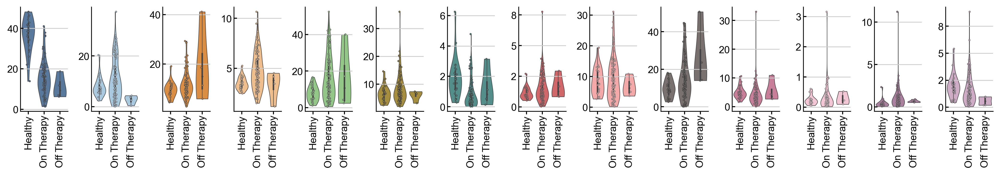

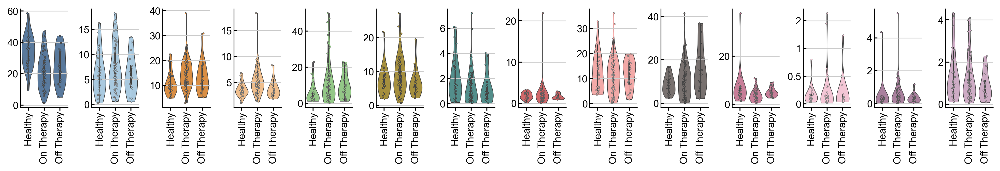

In [14]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)

adata_obs_small = adata[adata.obs['pop_cov']=='Asian'].obs
ind_count = adata_obs_small.groupby(['ind_cov_SLE_status','SLE_status','No_Meds','Prednisone',
                                     'Azathioprine','Methotrexate','Calcineurin inhibitor',
                                     'Hydroxychloroquine','Mycophenolate','ct_cov'],
                                     observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_SLE_status==ind_count_sums.ind_cov_SLE_status[ii]] = ind_count_sums.counts[ii]

ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc = ind_perc.set_index('ind_cov_SLE_status')

# Remove columns without data
ind_perc = ind_perc[ind_perc['No_Meds']!='error']
ind_perc['No_Meds'].loc[ind_perc['SLE_status']=='Healthy'] = -1
ind_perc_A = ind_perc.copy() # Store a copy

perc_plot = sns.catplot(x='No_Meds', y='ct_perc', 
                        hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, 
                        col='ct_cov', col_wrap=14, cut=0, dodge=False, height=2,
                        aspect=0.5,  linewidth=0.5, sharex=True, 
                        sharey=False, palette=colorrs)
perc_plot.set_yticklabels(size=10)
perc_plot.set_xticklabels(size=10)

for cg_i in list(range(len(MasterORDER))):
    cg = MasterORDER[cg_i]
    sns.stripplot(x="No_Meds", y="ct_perc", data=ind_perc[ind_perc.ct_cov == cg], 
                  linewidth=0.5, color=colorrs_desat[cg_i], size=1.5, ax=perc_plot.axes[cg_i])#
    perc_plot.axes[cg_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[cg_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[cg_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[cg_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[cg_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
    
perc_plot.set_xticklabels(rotation=90)
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.fig.subplots_adjust(hspace = 0.3, wspace = 0.5)
perc_plot.set_xticklabels(["Healthy",'On Therapy',"Off Therapy"])
perc_plot.savefig(figdir+"/violin.nomeds.Asian.lymph.png")

Asian_effect_nomeds, Asian_Pval_nomeds = get_proportion_stats(ind_perc, group1=[-1], group2=[1], covar='No_Meds', ct_name='ct_cov') # Healthy vs. No meds

##################################################################################################################

adata_obs_small = adata[adata.obs['pop_cov']=='European'].obs
ind_count = adata_obs_small.groupby(['ind_cov_SLE_status','SLE_status','No_Meds','Prednisone',
                                     'Azathioprine','Methotrexate','Calcineurin inhibitor',
                                     'Hydroxychloroquine','Mycophenolate','ct_cov'],
                                      observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_SLE_status==ind_count_sums.ind_cov_SLE_status[ii]] = ind_count_sums.counts[ii]

ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc = ind_perc.set_index('ind_cov_SLE_status')

# Remove columns without data
ind_perc = ind_perc[ind_perc['No_Meds']!='error']
ind_perc['No_Meds'].loc[ind_perc['SLE_status']=='Healthy'] = -1
ind_perc_E = ind_perc.copy() # Store a copy

perc_plot = sns.catplot(x='No_Meds', y='ct_perc', 
                        hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, 
                        col='ct_cov', col_wrap=14, cut=0, dodge=False, height=2,
                        aspect=0.5,  linewidth=0.5, sharex=True, 
                        sharey=False, palette=colorrs)
perc_plot.set_yticklabels(size=10)
perc_plot.set_xticklabels(size=10)

for cg_i in list(range(len(MasterORDER))):
    cg = MasterORDER[cg_i]
    sns.stripplot(x="No_Meds", y="ct_perc", data=ind_perc[ind_perc.ct_cov == cg], 
                  linewidth=0.5, color=colorrs_desat[cg_i], size=1.5, ax=perc_plot.axes[cg_i])#
    perc_plot.axes[cg_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[cg_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[cg_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[cg_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[cg_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
    
perc_plot.set_xticklabels(rotation=90)
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.fig.subplots_adjust(hspace = 0.3, wspace = 0.5)
perc_plot.set_xticklabels(["Healthy",'On Therapy',"Off Therapy"])
perc_plot.savefig(figdir+"/violin.nomeds.EUR.lymph.png")

Euro_effect_nomeds, Euro_Pval_nomeds = get_proportion_stats(ind_perc, group1=[-1], group2=[1], covar='No_Meds', ct_name='ct_cov') # Healthy vs. No meds

# Generate excel sheet summarizing data
tmp = pd.DataFrame.from_dict(Asian_Pval_nomeds, orient='index', columns=['P value'])
tmpE = pd.DataFrame.from_dict(Euro_Pval_nomeds, orient='index', columns=['P value'])

Adiffs = []; Ediffs = []
for ct in tmp.index.tolist():
    Adiffs.append(np.round(ind_perc_A[(ind_perc_A['ct_cov']==ct) & (ind_perc_A['No_Meds']==1)]['ct_perc'].mean() - ind_perc_A[(ind_perc_A['ct_cov']==ct) & (ind_perc_A['No_Meds']==-1)]['ct_perc'].mean(),3))
    Ediffs.append(np.round(ind_perc_E[(ind_perc_E['ct_cov']==ct) & (ind_perc_E['No_Meds']==1)]['ct_perc'].mean() - ind_perc_E[(ind_perc_E['ct_cov']==ct) & (ind_perc_E['No_Meds']==-1)]['ct_perc'].mean(),3))

tmp['No Meds/Healthy % change'] = pd.DataFrame(Adiffs, index=tmp.index.tolist())
tmp['Ethnicity'] = 'Asian'
tmpE['No Meds/Healthy % change'] = pd.DataFrame(Ediffs, index=tmp.index.tolist())
tmpE['Ethnicity'] = 'European'

summary = pd.concat([tmp,tmpE])
summary['Fischers Method P'] = Fish_results['Combined P']
summary['Significant?'] = Fish_results['Significant']
display(summary)

In [15]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)

adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_SLE_status','pop_cov','SLE_status','Prednisone',
                                     'Azathioprine','Methotrexate','Calcineurin inhibitor',
                                     'Hydroxychloroquine','Mycophenolate','ct_cov'],observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum().reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_SLE_status==ind_count_sums.ind_cov_SLE_status[ii]] = ind_count_sums.counts[ii]

ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc = ind_perc.set_index('ind_cov_SLE_status')
ind_perc = ind_perc[ind_perc['Prednisone']!='error']
ind_perc = ind_perc[ind_perc['SLE_status']=='SLE'] # Cases only

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


 
Prednisone


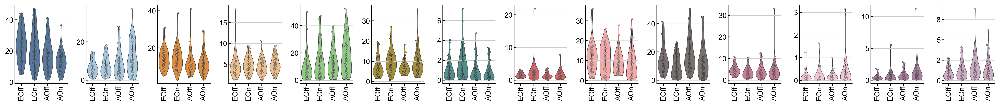

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,-2.9600425933294656,T4_naive,0.262309
1,0.9355040614992804,T8_naive,0.345478
2,-0.1666478296622988,T4_em,0.898215
3,0.20508465979668028,T4_reg,0.738317
4,3.641707282043254,CytoT_GZMH+,0.170647
5,3.8663450549950507,CytoT_GZMK+,0.000891
6,0.37435470129409637,T_mait,0.238194
7,0.8819110458815616,NK_bright,0.141961
8,-0.8259231188659728,NK_dim,0.602439
9,-5.323336748618243,B_naive,0.009576


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,-4.616847191223821,T4_naive,0.012196
1,1.928331518069273,T8_naive,0.220378
2,-0.8578513967993913,T4_em,0.507621
3,0.31037156054380255,T4_reg,0.420937
4,4.97314699037234,CytoT_GZMH+,0.042993
5,2.701015014913477,CytoT_GZMK+,0.006216
6,-0.22191090372578504,T_mait,0.301300
7,0.2924289431637694,NK_bright,0.179979
8,-0.7140486684913323,NK_dim,0.578825
9,-4.70351579223936,B_naive,0.051712


Fisher:


,Combined P,Significant
T4_naive,0.0215782,False
T8_naive,0.272203,False
T4_em,0.814042,False
T4_reg,0.673985,False
CytoT_GZMH+,0.0433952,False
CytoT_GZMK+,7.25704e-05,True
T_mait,0.260827,False
NK_bright,0.119245,False
NK_dim,0.716078,False
B_naive,0.00426406,False


 
Azathioprine


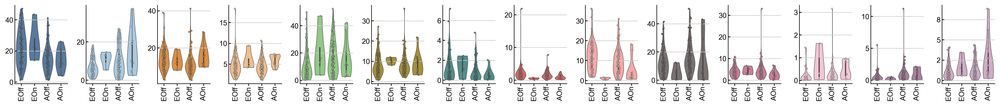

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,2.5031645428222355,T4_naive,0.701662
1,2.6843687365037208,T8_naive,0.271677
2,-2.3639917994587107,T4_em,0.460914
3,0.21784316090066919,T4_reg,0.885580
4,13.6876040490545,CytoT_GZMH+,0.035136
5,2.037383651055569,CytoT_GZMK+,0.492848
6,0.2553585204452813,T_mait,0.736609
7,-1.702598064239436,NK_bright,0.318620
8,-10.115938593483623,NK_dim,0.008131
9,-8.130216214239173,B_naive,0.110038


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,-2.0747012852179223,T4_naive,0.529762
1,3.905529369336794,T8_naive,0.158432
2,2.3917021045083215,T4_em,0.293656
3,1.043255843651556,T4_reg,0.122917
4,1.4525481996433742,CytoT_GZMH+,0.740214
5,0.37134550239782194,CytoT_GZMK+,0.834499
6,-0.3582622428130826,T_mait,0.349852
7,-0.5340000151616262,NK_bright,0.162293
8,-4.936456345354086,NK_dim,0.027364
9,-0.3916593956668545,B_naive,0.927550


Fisher:


,Combined P,Significant
T4_naive,0.739573,False
T8_naive,0.178435,False
T4_em,0.406035,False
T4_reg,0.350262,False
CytoT_GZMH+,0.120922,False
CytoT_GZMK+,0.776695,False
T_mait,0.607136,False
NK_bright,0.20488,False
NK_dim,0.0020938,True
B_naive,0.334995,False


 
Methotrexate


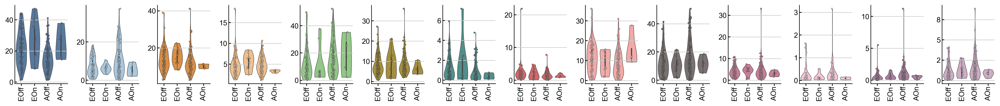

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,3.5720291736959964,T4_naive,0.392959
1,-1.2985759610851626,T8_naive,0.407732
2,1.7849047922320094,T4_em,0.384895
3,0.6552497690839257,T4_reg,0.499000
4,-0.10897453494889564,CytoT_GZMH+,0.979437
5,-1.1850831614578514,CytoT_GZMK+,0.533959
6,0.11044322027409441,T_mait,0.834409
7,-0.2017853668621055,NK_bright,0.832192
8,-1.8032976945485055,NK_dim,0.471462
9,-2.1991781038554676,B_naive,0.503688


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,10.100616775941699,T4_naive,0.022304
1,-4.329612528566045,T8_naive,0.250314
2,-1.857044959619896,T4_em,0.548917
3,-1.450944807991828,T4_reg,0.113860
4,-0.1682903996249874,CytoT_GZMH+,0.977430
5,-2.834087787416016,CytoT_GZMK+,0.238289
6,-0.5204842915129513,T_mait,0.305325
7,-0.15208931560634648,NK_bright,0.770540
8,7.016885726502776,NK_dim,0.020695
9,-3.188535810265647,B_naive,0.585215


Fisher:


,Combined P,Significant
T4_naive,0.0502818,False
T8_naive,0.334983,False
T4_em,0.539723,False
T4_reg,0.219761,False
CytoT_GZMH+,0.999076,False
CytoT_GZMK+,0.389561,False
T_mait,0.603136,False
NK_bright,0.926175,False
NK_dim,0.0549293,False
B_naive,0.654845,False


 
Calcineurin inhibitor


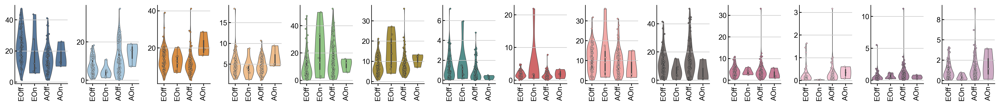

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,-9.089630131027462,T4_naive,0.028036
1,-3.4634226992640005,T8_naive,0.025554
2,-0.2964713459455886,T4_em,0.885883
3,-0.4908392854758259,T4_reg,0.613918
4,10.919837957115568,CytoT_GZMH+,0.008415
5,5.8954831471170035,CytoT_GZMK+,0.001443
6,0.21037473217936334,T_mait,0.667376
7,2.021689094684545,NK_bright,0.031612
8,0.8114034511082538,NK_dim,0.747042
9,-4.45013946317603,B_naive,0.205002


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,0.9351806903398041,T4_naive,0.869810
1,3.6707723334347033,T8_naive,0.444404
2,9.960608733639791,T4_em,0.010055
3,1.9808857530808504,T4_reg,0.089273
4,-3.6969658646755286,CytoT_GZMH+,0.624817
5,3.243709709895138,CytoT_GZMK+,0.288907
6,-0.5877806929915756,T_mait,0.362880
7,0.2525188510661004,NK_bright,0.703270
8,-2.8098563704803228,NK_dim,0.472500
9,-11.505180713028178,B_naive,0.119206


Fisher:


,Combined P,Significant
T4_naive,0.114948,False
T8_naive,0.0622105,False
T4_em,0.0509589,False
T4_reg,0.213962,False
CytoT_GZMH+,0.0328515,False
CytoT_GZMK+,0.00366044,False
T_mait,0.585605,False
NK_bright,0.10685,False
NK_dim,0.720551,False
B_naive,0.11514,False


 
Hydroxychloroquine


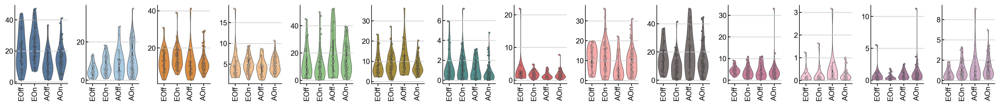

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,2.806597953092685,T4_naive,0.304839
1,2.4905106327875717,T8_naive,0.013555
2,0.9694152762572031,T4_em,0.471463
3,-0.14520437161400407,T4_reg,0.819278
4,0.39720203626813466,CytoT_GZMH+,0.885912
5,0.49469366171929674,CytoT_GZMK+,0.691973
6,-0.2997649954684707,T_mait,0.363689
7,-0.6582430362119664,NK_bright,0.290619
8,0.3746645683261077,NK_dim,0.819556
9,-5.598766571442263,B_naive,0.008159


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,2.184397486547938,T4_naive,0.316690
1,2.5971027025067412,T8_naive,0.156485
2,-1.241966558071473,T4_em,0.410596
3,0.5769296105485302,T4_reg,0.198389
4,-1.912660956139479,CytoT_GZMH+,0.509105
5,-2.593770546437551,CytoT_GZMK+,0.025319
6,-0.3823592088494672,T_mait,0.122277
7,-0.0790784593326802,NK_bright,0.760311
8,1.7494054142837747,NK_dim,0.242237
9,-2.1669935661993853,B_naive,0.446468


Fisher:


,Combined P,Significant
T4_naive,0.32223,False
T8_naive,0.0151785,False
T4_em,0.511453,False
T4_reg,0.45784,False
CytoT_GZMH+,0.810144,False
CytoT_GZMK+,0.0883791,False
T_mait,0.182905,False
NK_bright,0.55456,False
NK_dim,0.519511,False
B_naive,0.0240964,False


 
Mycophenolate


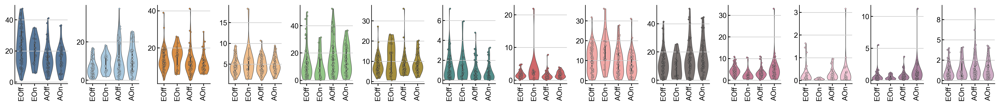

['European0.0'] versus ['European1.0']


,Beta,Cell,Pval
0,-6.535470956484085,T4_naive,0.026787
1,1.581986494795959,T8_naive,0.156915
2,2.145927632242898,T4_em,0.142499
3,1.548593030289277,T4_reg,0.023342
4,-2.1771873066259695,CytoT_GZMH+,0.471025
5,2.7115408284772946,CytoT_GZMK+,0.044111
6,-0.09795818522626573,T_mait,0.787340
7,1.298998918821622,NK_bright,0.053932
8,3.894267400654333,NK_dim,0.027479
9,-1.2762359075395349,B_naive,0.599219


['Asian0.0'] versus ['Asian1.0']


,Beta,Cell,Pval
0,0.8963816960458882,T4_naive,0.633318
1,1.3979513973680917,T8_naive,0.376464
2,-0.6296980933161571,T4_em,0.627777
3,0.05363052842020702,T4_reg,0.889868
4,-3.1291451106255344,CytoT_GZMH+,0.207261
5,0.9950670997194044,CytoT_GZMK+,0.323676
6,-0.3071201003534337,T_mait,0.152233
7,0.44732112063888624,NK_bright,0.039296
8,-1.5999243632224676,NK_dim,0.213062
9,-1.057453467247214,B_naive,0.665871


Fisher:


,Combined P,Significant
T4_naive,0.0861235,False
T8_naive,0.226189,False
T4_em,0.305408,False
T4_reg,0.101244,False
CytoT_GZMH+,0.324762,False
CytoT_GZMK+,0.0749443,False
T_mait,0.374134,False
NK_bright,0.0151672,False
NK_dim,0.0359505,False
B_naive,0.765601,False


In [16]:
meds = ['Prednisone', 'Azathioprine','Methotrexate','Calcineurin inhibitor','Hydroxychloroquine','Mycophenolate']
for m in meds:
    print(' ')
    print(m)
    ind_perc[m] = ind_perc[m].astype('category')
    ind_perc['pop_{}'.format(m)] = ind_perc['pop_cov'].astype('str')+ind_perc[m].astype('str')
    ind_perc['pop_{}'.format(m)] = ind_perc['pop_{}'.format(m)].astype('category')
    
    perc_plot = sns.catplot(x='pop_{}'.format(m), y='ct_perc',
                        hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER,
                        order=['European0.0', 'European1.0', 'Asian0.0','Asian1.0'],
                        col='ct_cov', col_wrap=14, cut=0, dodge=False,
                        height=2, aspect=0.7,  linewidth=0.5, sharex=False, sharey=False, palette=colorrs)

    perc_plot.set_yticklabels(size=10)
    perc_plot.set_xticklabels(size=10)

    for ct_i in list(range(len(MasterORDER))):
        ct = MasterORDER[ct_i]
        sns.stripplot(x='pop_{}'.format(m), y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct],
                      order=['European0.0', 'European1.0', 'Asian0.0','Asian1.0'], 
                      color=colorrs_desat[ct_i], jitter=True, size=2, linewidth=0.5, ax=perc_plot.axes[ct_i])
        perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
        perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
        perc_plot.axes[ct_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
        perc_plot.axes[ct_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
        perc_plot.axes[ct_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
    perc_plot.set_titles('')
    perc_plot.fig.tight_layout()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.35, hspace = 0.75)
    perc_plot.set_xticklabels(["EOff", "EOn", "AOff", "AOn"])
    perc_plot.savefig(figdir+"/violin.{}.lymph.png".format(m))
    plt.show()
    
    _,Med_Euro_Pval = get_proportion_stats(ind_perc, group1=['European0.0'], group2=['European1.0'], covar='pop_{}'.format(m), ct_name='ct_cov') # Off vs On Euro
    _,Med_Asian_Pval = get_proportion_stats(ind_perc, group1=['Asian0.0'], group2=['Asian1.0'], covar='pop_{}'.format(m), ct_name='ct_cov') # Off vs On Asian
    Fish_results = Fishers_method(Med_Euro_Pval, Med_Asian_Pval)
    print('Fisher:')
    display(Fish_results)
    
    

# Flare

In [17]:
adata.obs['ind_cov_Flare'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov'] + row['Flare'], axis=1), ordered=True)


In [18]:
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_Flare','ct_cov','Flare',
                                     'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = (ind_count/ind_count.groupby(level=[0]).transform(sum))*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_Flare==ind_count_sums.ind_cov_Flare[ii]] = ind_count_sums.counts[ii]

ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
# Keep only Naive T4 and CytoGZMH for plotting
ind_perc = ind_perc[ind_perc['ct_cov'].isin(['T4_naive', 'CytoT_GZMH+'])]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


['Healthy'] versus ['Flare']


,Beta,Cell,Pval
0,11.876186475364955,CytoT_GZMH+,0.000000
1,-21.37658428567808,T4_naive,0.000000


['Healthy'] versus ['Managed']


,Beta,Cell,Pval
0,7.459092213662245,CytoT_GZMH+,0.000022
1,-16.646309266843062,T4_naive,0.000000


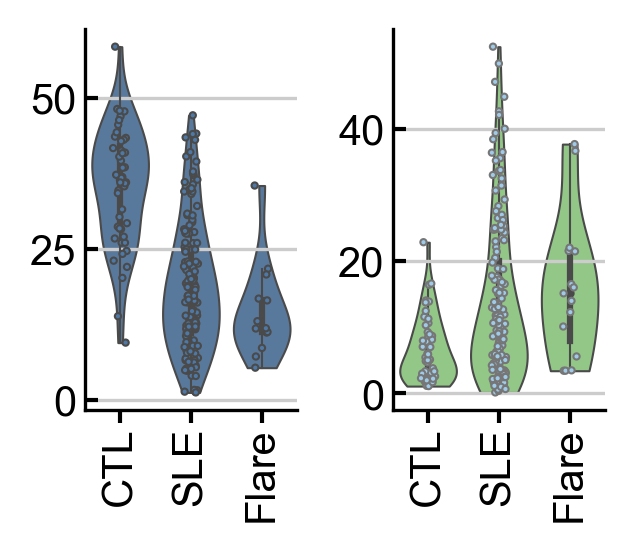

In [19]:
ind_perc.ct_cov = ind_perc.ct_cov.astype('object')
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
perc_plot = sns.catplot(x='Flare', y='ct_perc', order=['Healthy', 'Managed', 'Flare'],
                        hue='ct_cov', data=ind_perc, 
                        kind='violin', col_order=['T4_naive', 'CytoT_GZMH+'], col='ct_cov',
                        col_wrap=7, cut=0, dodge=False,
                        height=1.75, aspect=0.6,  linewidth=0.5, sharex=True, sharey=False,
                        palette=[colorrs[4], colorrs[0]])
perc_plot.set_yticklabels(size=10)
perc_plot.set_xticklabels(size=10)
for ct_i in list(range(len(['T4_naive', 'CytoT_GZMH+']))):
    ct = ['T4_naive', 'CytoT_GZMH+'][ct_i]
    sns.stripplot(x="Flare", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct],
                  order=['Healthy', 'Managed', 'Flare'], 
                  color=colorrs_desat[ct_i], size=1.5, linewidth=0.5, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes[ct_i].tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.axes[ct_i].yaxis.set_major_formatter(mtick.FuncFormatter(formatter))
perc_plot.set_titles('')
perc_plot.fig.tight_layout()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.45, hspace = 0.25)
perc_plot.set_xticklabels(["CTL", "SLE", "Flare"])
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_FLARE.pdf")
_ = get_proportion_stats(ind_perc, group1=['Healthy'], group2=['Flare'], covar='Flare', ct_name='ct_cov')
_ = get_proportion_stats(ind_perc, group1=['Healthy'], group2=['Managed'], covar='Flare', ct_name='ct_cov')

# Figure 3B

... storing 'ind_cov' as categorical
... storing 'Status' as categorical
... storing 'Flare' as categorical
... storing 'No_Meds' as categorical
... storing 'Prednisone' as categorical
... storing 'Azathioprine' as categorical
... storing 'Methotrexate' as categorical
... storing 'Calcineurin inhibitor' as categorical
... storing 'Hydroxychloroquine' as categorical
... storing 'Mycophenolate' as categorical


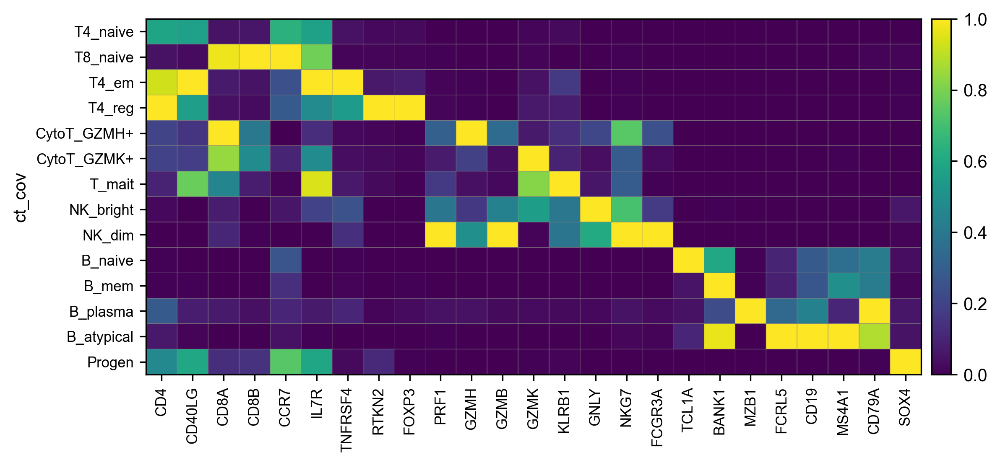

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[8.0, 0, 0.2])

In [20]:
sc.pl.matrixplot(adata, var_names=['CD4', 'CD40LG', 'CD8A', 'CD8B', 'CCR7', 'IL7R', 'TNFRSF4','RTKN2', 'FOXP3',
                                   'PRF1','GZMH', 'GZMB', 'GZMK','KLRB1','GNLY','NKG7',
                                   'FCGR3A', 'TCL1A', 'BANK1','MZB1','FCRL5','CD19', 'MS4A1','CD79A','SOX4'],
              groupby="ct_cov", save="Celltype_heatmap.png", show=True, standard_scale="var", log=False)



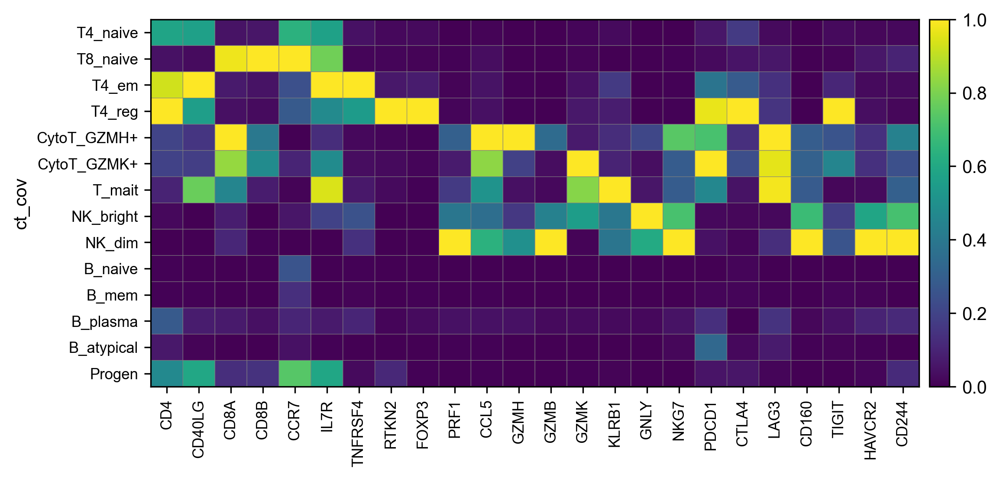

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[7.68, 0, 0.2])

In [21]:
sc.pl.matrixplot(adata, var_names=['CD4', 'CD40LG', 'CD8A', 'CD8B', 'CCR7', 'IL7R', 'TNFRSF4','RTKN2', 'FOXP3',
                                   'PRF1','CCL5','GZMH', 'GZMB', 'GZMK','KLRB1','GNLY','NKG7','PDCD1', 'CTLA4',
                                   'LAG3','CD160', 'TIGIT', 'HAVCR2', 'CD244'],
              groupby="ct_cov", save="SuppFig3D.png", show=True, standard_scale="var", log=False)



# GZMH Analysis

In [22]:
cdata = adata[adata.obs['ct_cov']=='CytoT_GZMH+'].copy()
print(cdata)

AnnData object with n_obs × n_vars = 70440 × 2000
    obs: 'louvain', 'ct_cov', 'batch_cov', 'ind_cov', 'Processing_Cohort', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status', 'Dominant Signal', 'cytotoxic_score', 'exhaustion_score', 'Type 1 Interferon Score', 'mait', 'tc_expanded', 'th_expanded', 'Flare', 'pop_cov_SLE_status', 'ind_cov_pop_cov', 'ind_cov_SLE_status', 'No_Meds', 'Prednisone', 'Azathioprine', 'Methotrexate', 'Calcineurin inhibitor', 'Hydroxychloroquine', 'Mycophenolate', 'ind_cov_Flare'
    var: 'gene_ids'
    uns: 'neighbors', 'pca', 'umap', 'louvain_colors', 'ct_cov_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [23]:
X = cdata.raw.X
obs = pd.DataFrame()
for o in list(cdata.obs.keys()):
    obs[o] = cdata.obs[o]
var_names = cdata.raw.var_names.tolist()
var = pd.DataFrame(index=var_names)
ddata = ad.AnnData(X, obs=obs, var=var, dtype='int32')
ddata.obsm['X_umap'] = cdata.obsm['X_umap']
ddata.raw = ddata
obs_names = cdata.obs_names.tolist()
cdata = ddata
cdata.obs_names = obs_names
print('Dataset: {}'.format(cdata))

Dataset: AnnData object with n_obs × n_vars = 70440 × 32738
    obs: 'louvain', 'ct_cov', 'batch_cov', 'ind_cov', 'Processing_Cohort', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status', 'Dominant Signal', 'cytotoxic_score', 'exhaustion_score', 'Type 1 Interferon Score', 'mait', 'tc_expanded', 'th_expanded', 'Flare', 'pop_cov_SLE_status', 'ind_cov_pop_cov', 'ind_cov_SLE_status', 'No_Meds', 'Prednisone', 'Azathioprine', 'Methotrexate', 'Calcineurin inhibitor', 'Hydroxychloroquine', 'Mycophenolate', 'ind_cov_Flare'
    obsm: 'X_umap'


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


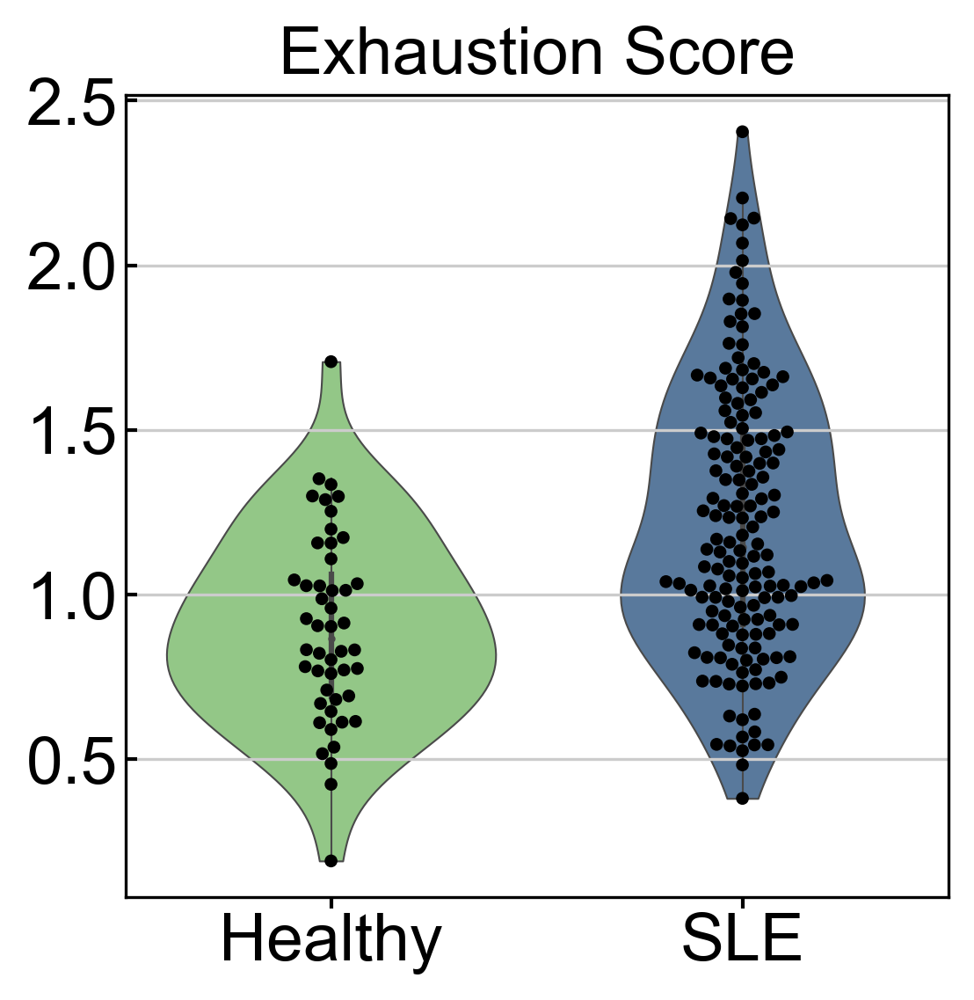

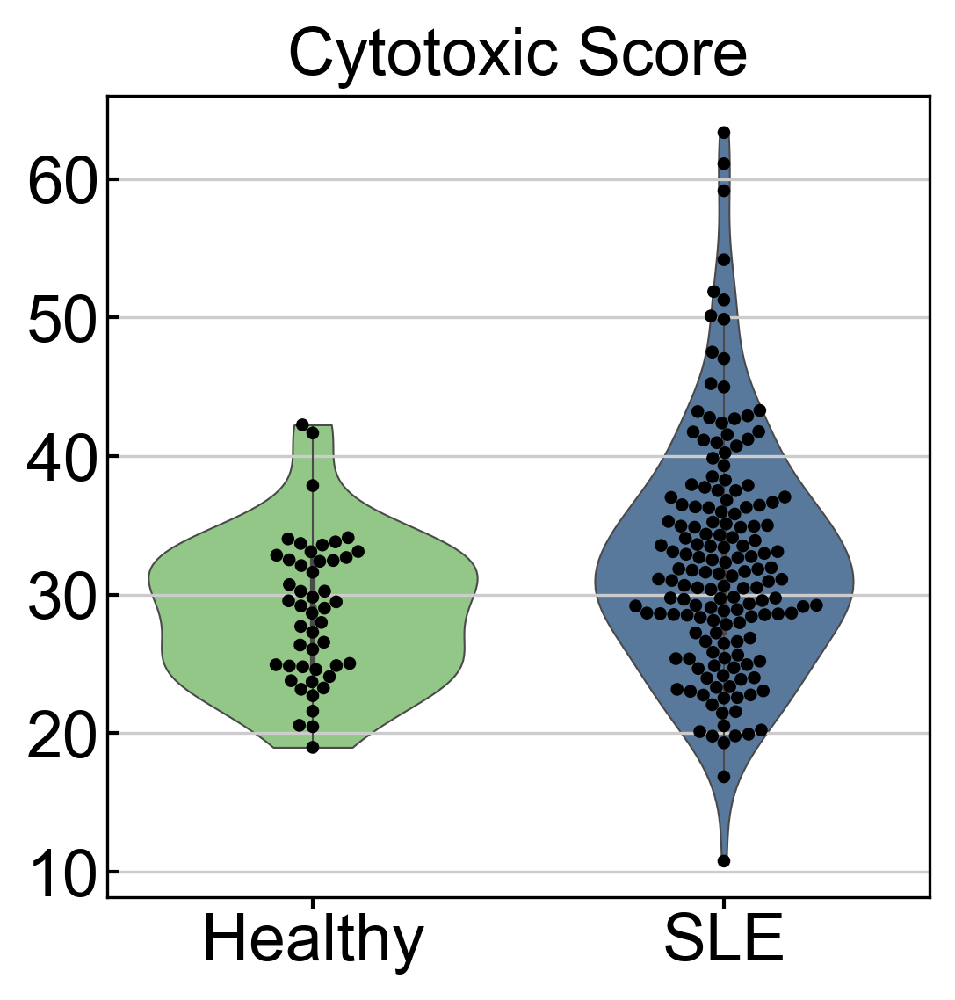

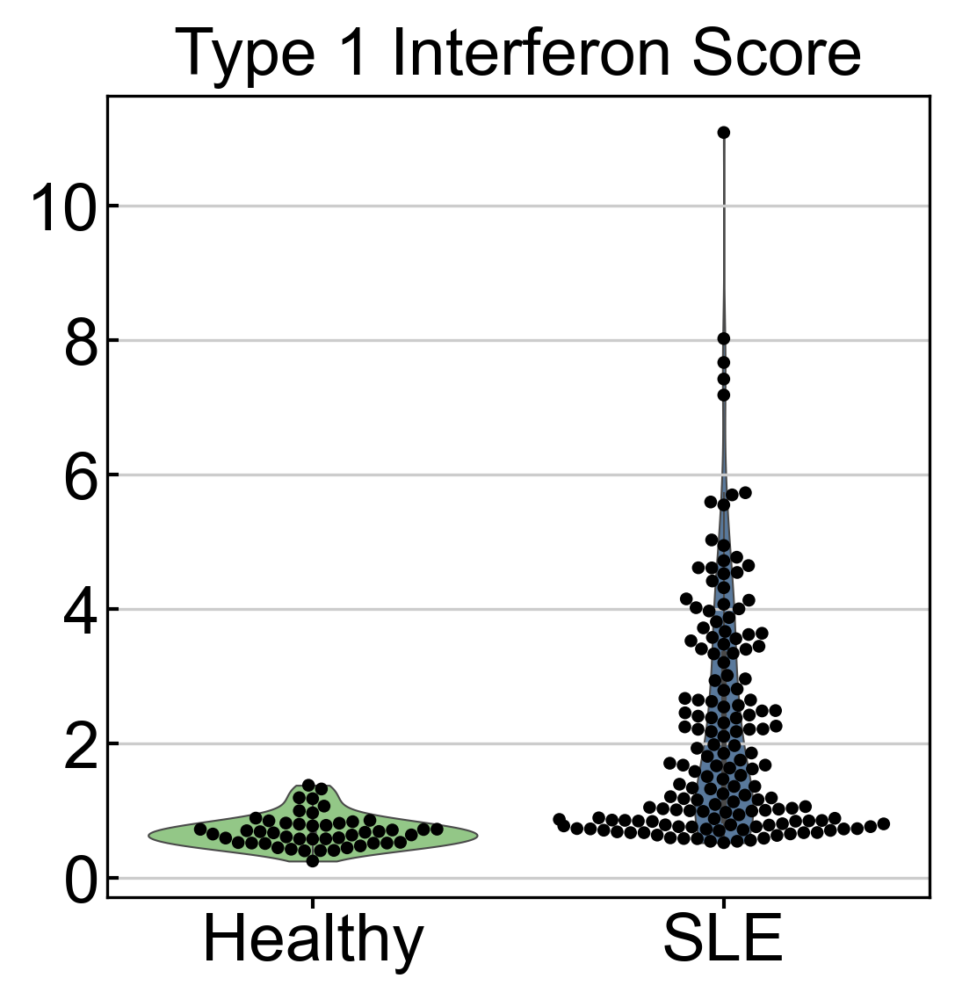

In [24]:
def get_pseudobulk(adata, save=False, load=False, savetitle=""):
    if load == True:
        pseudobulk = pd.read_csv(savetitle, index_col=0)
    else:
        genes = adata.raw.var_names.tolist()
        people = np.unique(adata.obs['ind_cov'].tolist())
        pseudobulk = pd.DataFrame(index=genes, columns=people)
        for ii in range(len(people)):
            fdata = adata[adata.obs['ind_cov'] == people[ii]]
            pseudobulk[people[ii]] = np.ravel(np.sum(fdata.raw.X, axis=0)/np.sum(fdata.raw.X))
        if save == True:
            pseudobulk.to_csv(savetitle)
    return pseudobulk


def get_pseudobulk_score(pseudobulk, cdata, score_genes, score_name):
    SLE_people = cdata.obs['ind_cov'][cdata.obs['SLE_status']=='SLE'].unique().tolist()
    Healthy_people = cdata.obs['ind_cov'][cdata.obs['SLE_status']=='Healthy'].unique().tolist()
    Frame = pd.DataFrame(pseudobulk[pseudobulk.index.isin(score_genes)].mean(axis=0)/pseudobulk.mean(axis=0), columns=[score_name])
    Frame['dz'] = np.repeat(np.nan, len(Frame))
    Frame['dz'][Frame.index.isin(SLE_people)] = 'SLE'
    Frame['dz'][Frame.index.isin(Healthy_people)] = 'Healthy'
    return Frame


def violin_score(Frame, cdata, score_genes, score_name):
    plt.figure()
    Frame = get_pseudobulk_score(pseudobulk, cdata, score_genes=score_genes, score_name=score_name)
    perc_plot = sns.violinplot(x='dz', y=score_name, order=['Healthy', 'SLE'], data=Frame, cut=0, dodge=False,
                        palette=[colorrs[4], colorrs[0]], linewidth=.5)
    perc_plot.set_xticklabels(perc_plot.get_xticklabels(), size=18)

    sns.swarmplot(x="dz", y=score_name, data=Frame,
                  order=['Healthy', 'SLE'], 
                  color='k', size=3, linewidth=0.5)

    perc_plot.axes.get_yaxis().label.set_visible(False)
    perc_plot.axes.get_xaxis().label.set_visible(False)
    perc_plot.axes.tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes.tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    perc_plot.set_xticklabels(["Healthy", "SLE"])
    plt.title('{}'.format(score_name))
    plt.savefig(figdir+"/violin.{}.png".format(score_name))
    plt.savefig(figdir+"/violin.{}.pdf".format(score_name))
    return Frame

    
pseudobulk = get_pseudobulk(cdata)
sc.settings.set_figure_params(dpi=150, dpi_save=150, format='pdf', frameon=False, transparent=True, fontsize=18)
cytotoxic_genes = ['PRF1', 'GZMH', 'GZMB']
exhaustion_genes = ['PDCD1', 'CTLA4', 'LAG3','CD160', 'TIGIT', 'HAVCR2', 'CD244']
t1_interferon_genes = ['ISG15', 'IFI6', 'IFI44L', 'IFI44', 'RSAD2', 'CXCL10', 'IFIT2', 'IFIT3', 'IFIT1', 
    'IFITM3', 'OAS1', 'OAS3', 'OAS2', 'OASL', 'EPSTI1', 'RNASE1', 'RNASE2', 'IFI27', 
    'XAF1', 'LGALS3BP','SIGLEC1', 'USP18', 'APOBEC3A', 'APOBEC3B', 'MX1']

ex_Frame = violin_score(pseudobulk, cdata, exhaustion_genes, score_name='Exhaustion Score')
cyto_Frame = violin_score(pseudobulk, cdata, cytotoxic_genes, score_name='Cytotoxic Score')
IFN_Frame = violin_score(pseudobulk, cdata, t1_interferon_genes, score_name='Type 1 Interferon Score')

In [25]:
s,p = stats.ranksums(ex_Frame['Exhaustion Score'][ex_Frame['dz']=='SLE'],
               ex_Frame['Exhaustion Score'][ex_Frame['dz']=='Healthy'])
print('Exhaustion p = {}'.format(p))

s,p = stats.ranksums(cyto_Frame['Cytotoxic Score'][cyto_Frame['dz']=='SLE'],
               cyto_Frame['Cytotoxic Score'][cyto_Frame['dz']=='Healthy'])
print('Cytotoxic p = {}'.format(p))
 
s,p = stats.ranksums(IFN_Frame['Type 1 Interferon Score'][IFN_Frame['dz']=='SLE'],
               IFN_Frame['Type 1 Interferon Score'][IFN_Frame['dz']=='Healthy'])
print('T1 IFN p = {}'.format(p))


Exhaustion p = 1.7267909660659891e-06
Cytotoxic p = 0.005600774594291153
T1 IFN p = 5.10691935583165e-15


## Plot Embedding of Dominant Signal 
### (found using Scanpy Score genes for each set of genes)

computing density on 'umap'


/opt/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:979: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrRd"))
  color_map.set_over('black')
/opt/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:980: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrRd"))
  color_map.set_under('lightgray')
/opt/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/scatterplots.py:400: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 a

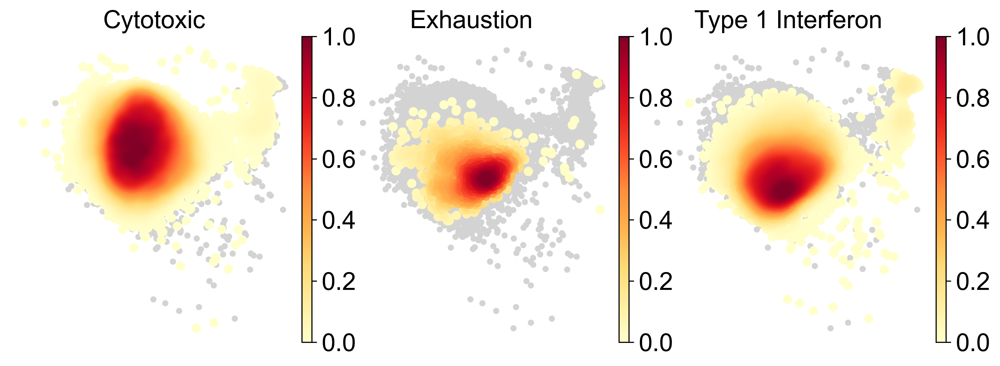

In [26]:
sc.tl.embedding_density(cdata, groupby='Dominant Signal')
sc.pl.embedding_density(cdata, key='umap_density_Dominant Signal', show=True, 
                        save='GZMH Dominant Score density plot.png', ncols=3, legend_loc=None, wspace=0)


# Single Cell - Pseudobulk Coexpression

<AxesSubplot:>

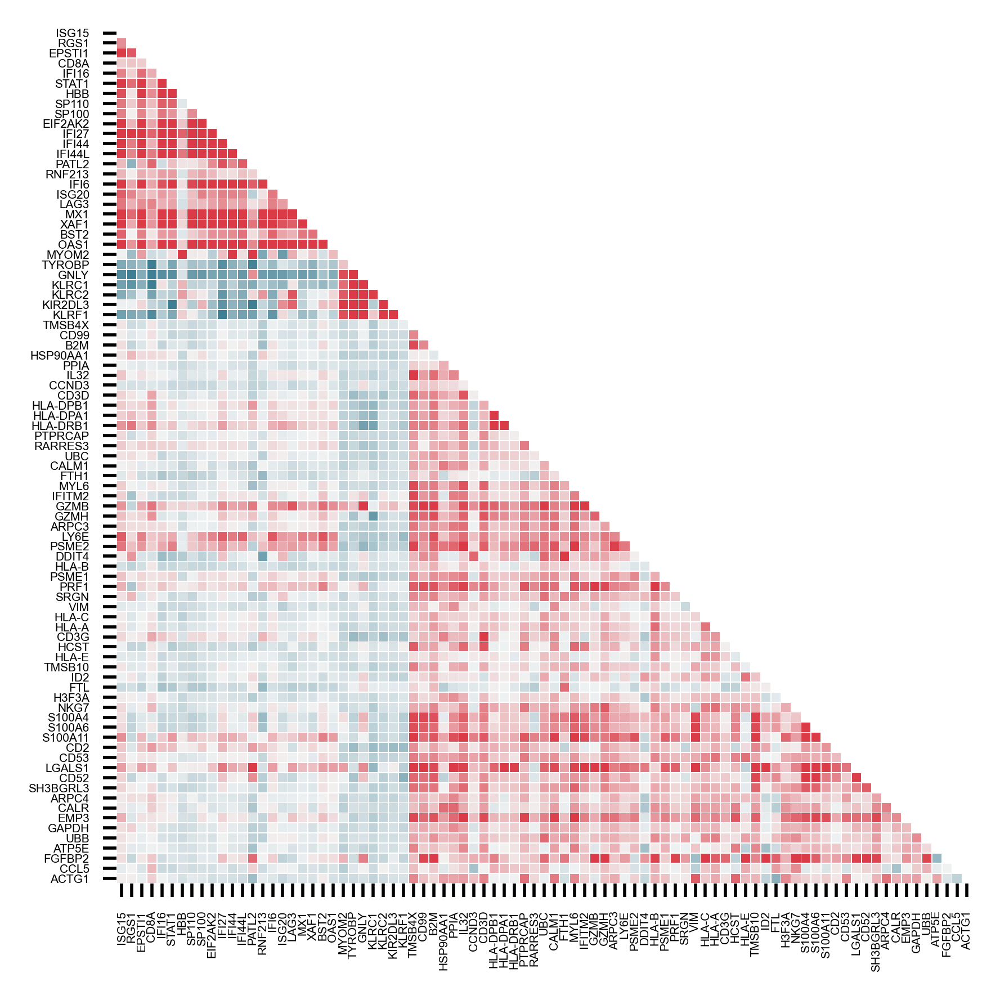

In [27]:
single_cell = pd.read_csv('Fig2-single-cell-expression-matrix.csv', index_col=0)
sc.settings.set_figure_params(dpi=250, dpi_save=500, frameon=False, transparent=True, fontsize=3)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
mask = np.triu(np.ones_like(single_cell, dtype=np.bool))
sns.heatmap(single_cell, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.1, cbar_kws={"shrink": .5}, xticklabels=1,
            yticklabels=1, vmin=-2, vmax=2, cbar=False)

<AxesSubplot:>

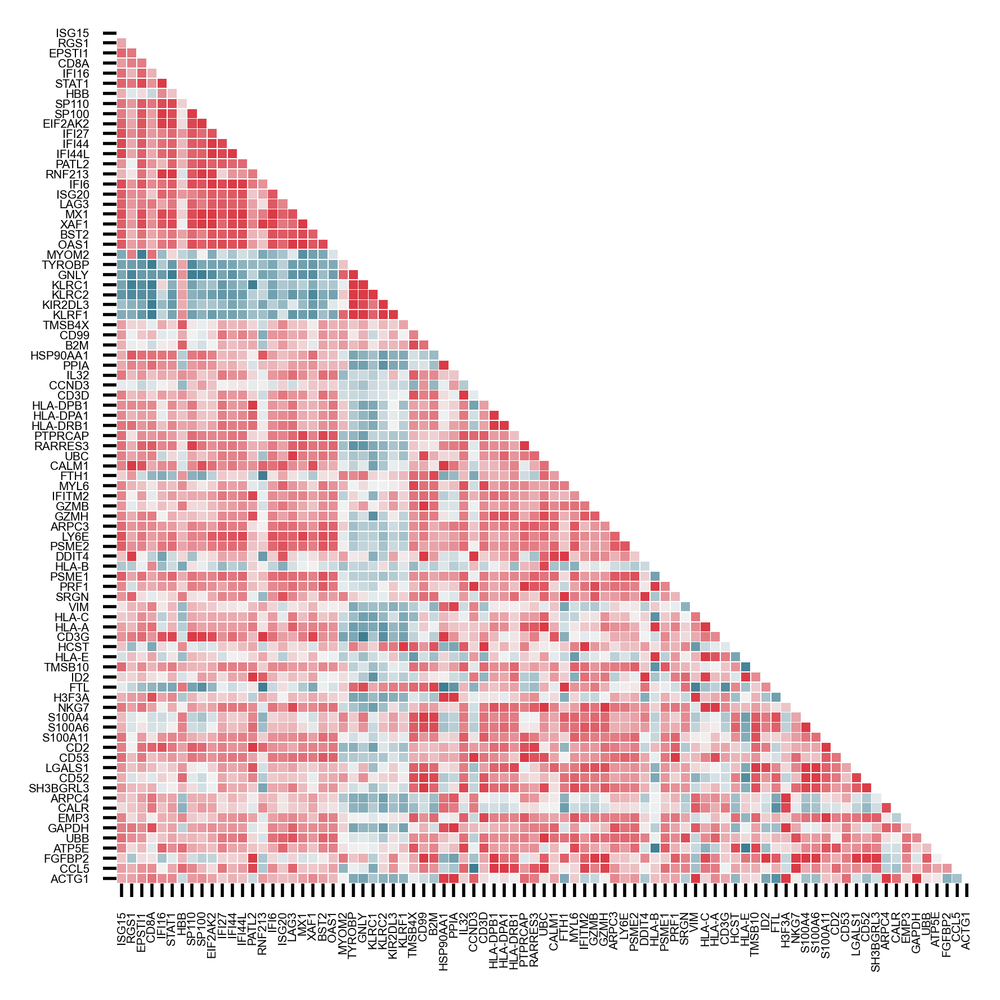

In [28]:
bulk = pd.read_csv('Fig2-pseudobulk-expression-matrix.csv', index_col=0)
sc.settings.set_figure_params(dpi=250, dpi_save=500, frameon=False, transparent=True, fontsize=3)
mask = np.triu(np.ones_like(bulk, dtype=np.bool))
sns.heatmap(bulk, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.1, cbar_kws={"shrink": .5}, xticklabels=1,
            yticklabels=1, vmin=-2, vmax=2, cbar=False)

# TCR Analysis Figures

In [29]:
adata = sc.read('Lupus_study_lymphocytes.h5ad', cache=False)
print(adata)

AnnData object with n_obs × n_vars = 793873 × 2000
    obs: 'louvain', 'ct_cov', 'batch_cov', 'ind_cov', 'Processing_Cohort', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status', 'Dominant Signal', 'cytotoxic_score', 'exhaustion_score', 'Type 1 Interferon Score', 'mait', 'tc_expanded', 'th_expanded'
    var: 'gene_ids'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


## MAIT cells

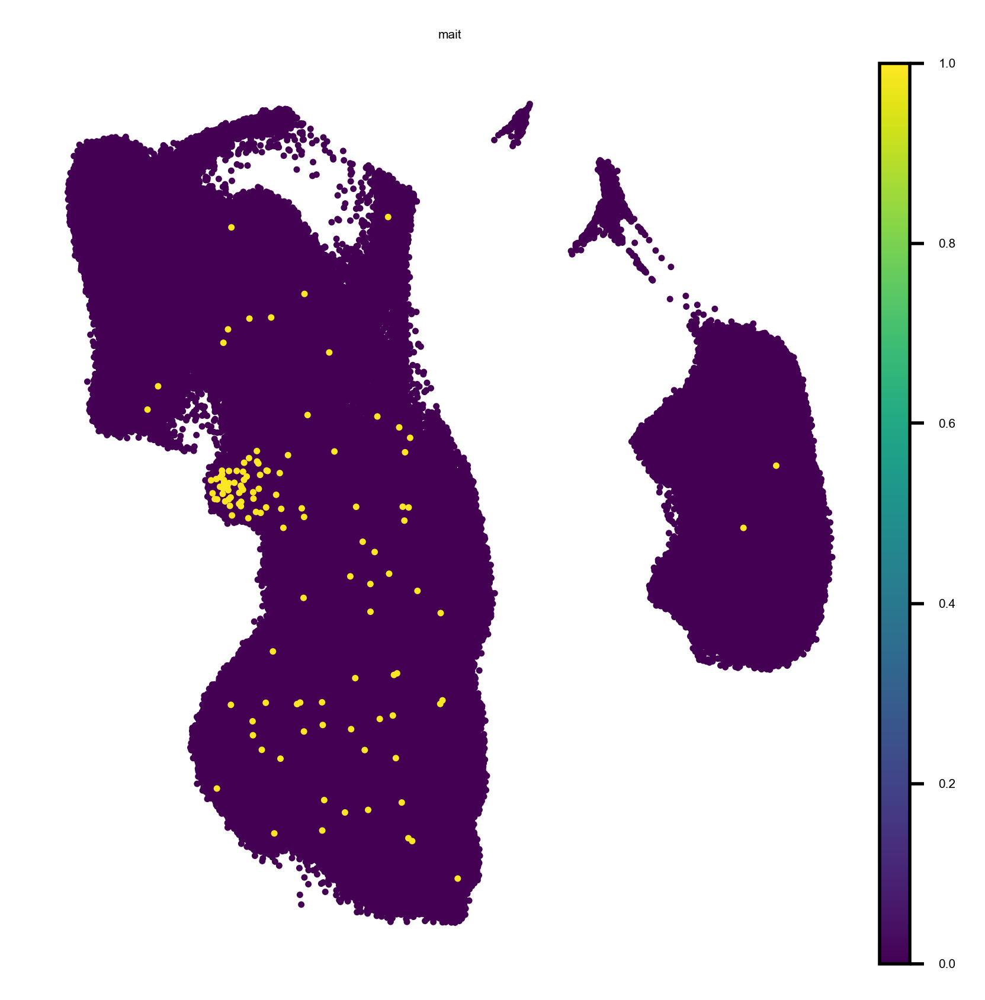

In [30]:
sc.pl.umap(adata[adata.obs.mait.argsort()], color='mait', size = 10, palette=["lightgray","darkred"], edgecolor="none", save="_tcr_mait.png", show=True)


## Tc Expanded

Trying to set attribute `.uns` of view, copying.


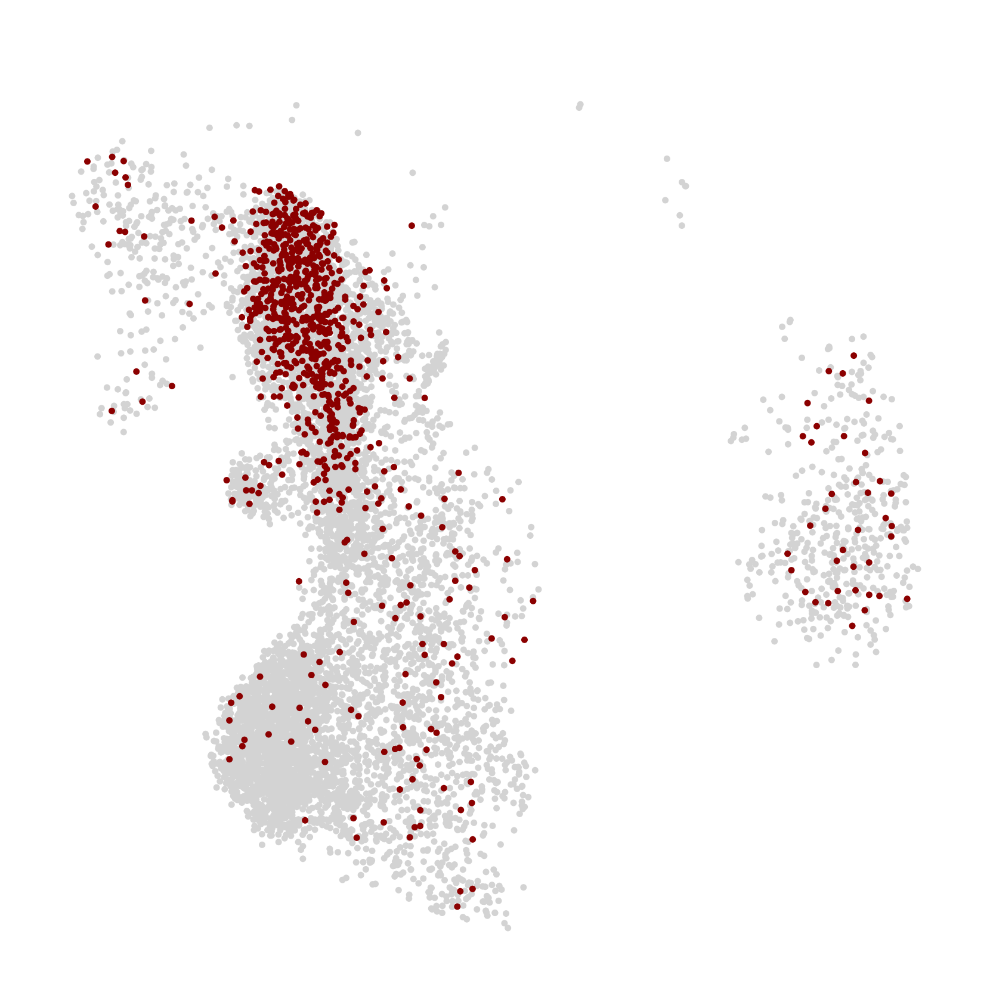

In [31]:
tmp = adata[adata.obs['tc_expanded'].isin(['Not Expanded', 'Expanded'])]
sc.pl.umap(tmp[np.flipud(tmp.obs.tc_expanded.argsort())], color='tc_expanded', show=True, size=10, 
           edgecolor="none", save="_tcr_tc_expansion.png", 
           palette=["darkred", "lightgray"], title=" ", legend_loc=None)



# Proportion of Expanded Tcs belonging to each Dominant Signal

[Text(0, 0, 'Cytotoxic'),
 Text(1, 0, 'Type 1 Interferon'),
 Text(2, 0, 'Exhaustion'),
 Text(3, 0, 'GZMK'),
 Text(4, 0, 'Rest')]

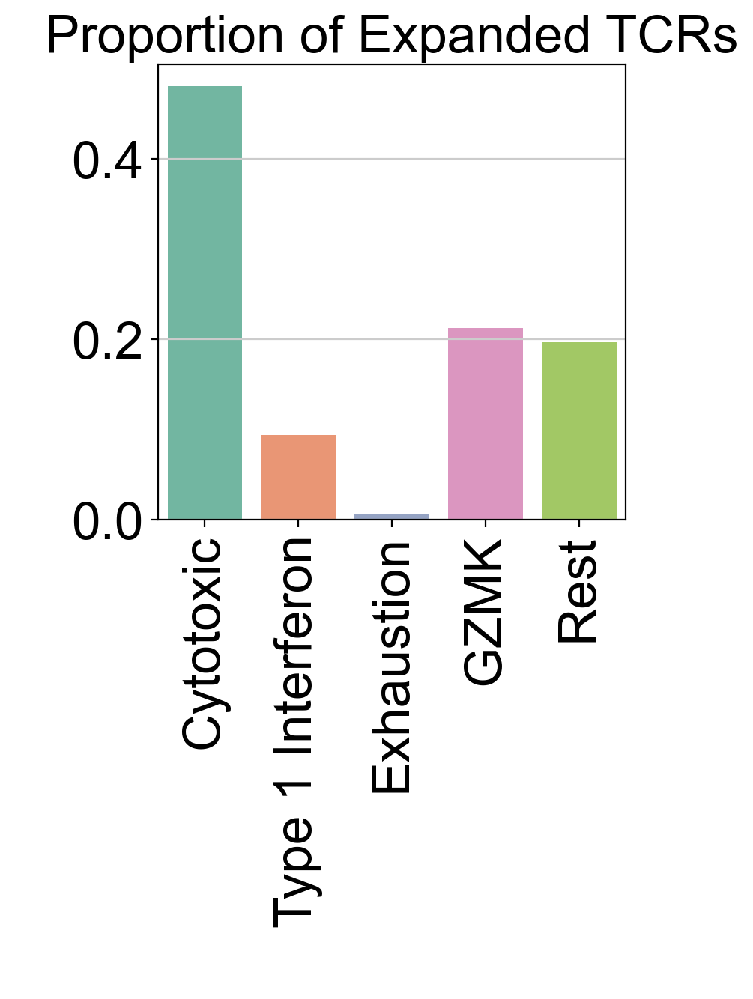

In [32]:
sc.settings.set_figure_params(dpi=100, dpi_save=150, format='pdf', frameon=False, transparent=True, fontsize=25)

C = (len(tmp[(tmp.obs['ct_cov']=='CytoT_GZMH+') & (tmp.obs['tc_expanded']=='Expanded') & (tmp.obs['Dominant Signal']=='Cytotoxic')])/len(tmp[tmp.obs['tc_expanded']=='Expanded']))
I = (len(tmp[(tmp.obs['ct_cov']=='CytoT_GZMH+') & (tmp.obs['tc_expanded']=='Expanded') & (tmp.obs['Dominant Signal']=='Type 1 Interferon')])/len(tmp[tmp.obs['tc_expanded']=='Expanded']))
E = (len(tmp[(tmp.obs['ct_cov']=='CytoT_GZMH+') & (tmp.obs['tc_expanded']=='Expanded') & (tmp.obs['Dominant Signal']=='Exhaustion')])/len(tmp[tmp.obs['tc_expanded']=='Expanded']))
K = (len(tmp[(tmp.obs['ct_cov']=='CytoT_GZMK+') & (tmp.obs['tc_expanded']=='Expanded')])/len(tmp[tmp.obs['tc_expanded']=='Expanded']))
O = (len(tmp[~(tmp.obs['ct_cov'].isin(['CytoT_GZMK+', 'CytoT_GZMH+'])) & (tmp.obs['tc_expanded']=='Expanded')])/len(tmp[tmp.obs['tc_expanded']=='Expanded']))

data = {'Cytotoxic': C, 'Type 1 Interferon':I, 'Exhaustion': E, 'GZMK':K, 'Rest':O}
data = pd.DataFrame.from_dict(data, orient='index', columns=['value'])
data = data.reset_index()

ax = sns.barplot(x='index', y='value', data=data, palette="Set2")
plt.title('Proportion of Expanded TCRs')
plt.ylabel(' ')
plt.xlabel(' ')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


computing density on 'umap'


Trying to set attribute `.obs` of view, copying.


/opt/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:979: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Reds"))
  color_map.set_over('black')
/opt/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:980: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Reds"))
  color_map.set_under('lightgray')
/opt/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/scatterplots.py:400: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and w

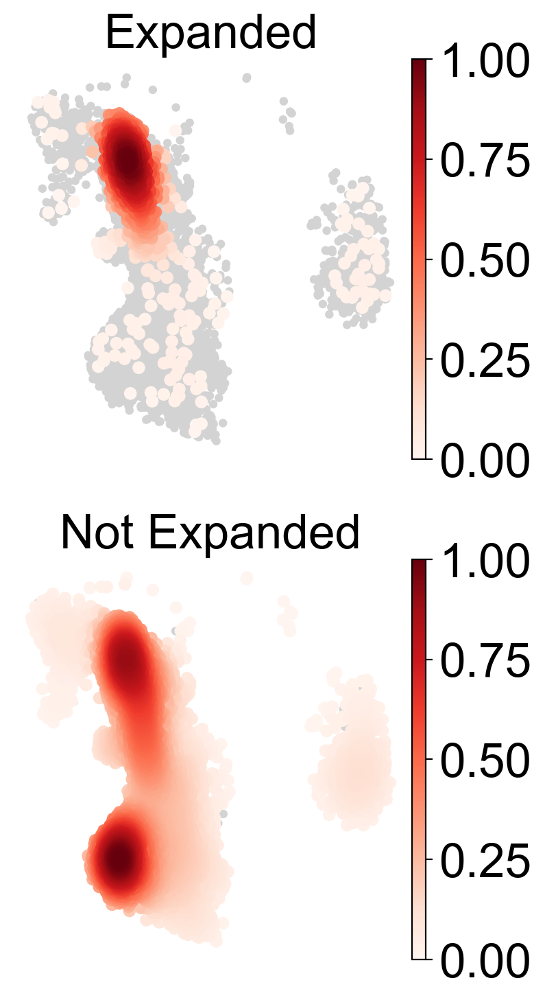

In [33]:
sc.tl.embedding_density(tmp, groupby='tc_expanded')
sc.pl.embedding_density(tmp, key='umap_density_tc_expanded', show=True, 
                        save='tc_expanded density plot.png', ncols=1, legend_loc=None, wspace=0, color_map='Reds')


Trying to set attribute `.uns` of view, copying.


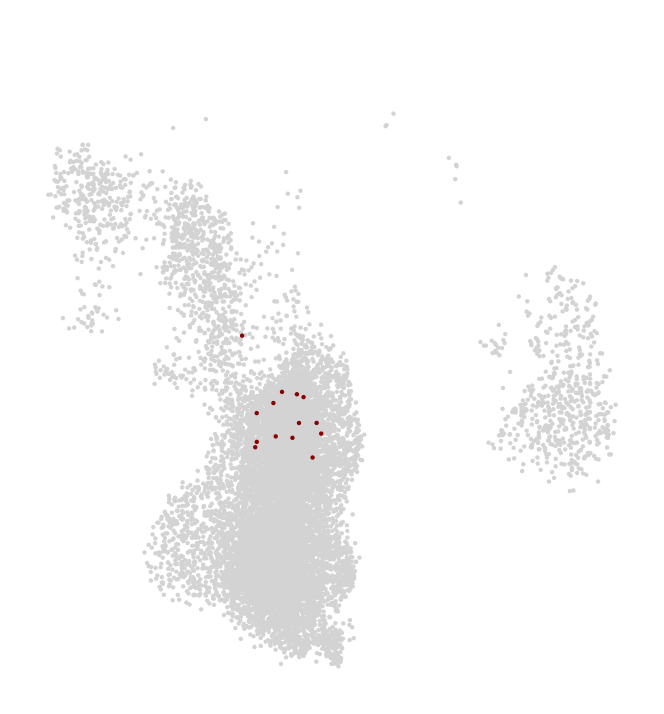

In [34]:
tmp = adata[adata.obs['th_expanded'].isin(['Not Expanded', 'Expanded'])]
sc.pl.umap(tmp[np.flipud(tmp.obs.th_expanded.argsort())], color='th_expanded', show=True, size=10, 
           edgecolor="none", save="_tcr_th_expansion.png", 
           palette=["darkred", "lightgray"], title=" ", legend_loc=None)



## TCR Analysis Code (Tony's Pipeline)

In [35]:
adata = sc.read('Lupus_study_lymphocytes.h5ad', cache=False)
print(adata)

def fix_tcr(file):
    ids = pd.read_excel('Master_V3.xlsx')
    for ID in file['groups'].unique():
        try:
            file['groups'][file['groups']==ID] = ids['Genotype_ID'][ids['Old_Genotype_ID'].isin([ID])].values[0]
        except:
            file['groups'][file['groups']==ID] = ids['Genotype_ID'][ids['Old_Genotype_ID'].isin([ID.split(',')[0]])].values[0]
    return file

th_tcr = pd.read_csv("Th_sharedclones_hiseq_CDR3.csv", index_col=False)
th_tcr = fix_tcr(th_tcr) # Fix naming nomenclature
tc_tcr = pd.read_csv("Tc_sharedclones_hiseq_CDR3.csv", index_col=False)
tc_tcr = fix_tcr(tc_tcr)

# All TCR
all_tcr = pd.read_csv("TCR_paired_final_hiseq.csv", index_col=False)
all_tcr = all_tcr[all_tcr['Sample_ID']!='lupus8.9'] # Remove this batch
ids = pd.read_excel('Master_V3.xlsx')
for ID in all_tcr['ind_cov'].unique(): # Fix naming nomenclature
    all_tcr['ind_cov'][all_tcr['ind_cov']==ID] = ids['Genotype_ID'][ids['Old_Genotype_ID'].isin([ID])].values[0]

fixsample = {'lupus8.17':'dmx_YE_8-17', 'lupus8.16':'dmx_YE_8-16', 'lupus7.20':'dmx_YE_7-20', 
             'lupus7.26':'dmx_YE_7-26', 'lupus7.13':'dmx_YE_7-13', 'lupus7.19':'dmx_YE_7-19',
             'lupus8.23':'dmx_YE_8-23'}
for batch in all_tcr['Sample_ID'].unique():
    all_tcr['Sample_ID'][all_tcr['Sample_ID']==batch] = fixsample[batch] # Fix nomenclature


AnnData object with n_obs × n_vars = 793873 × 2000
    obs: 'louvain', 'ct_cov', 'batch_cov', 'ind_cov', 'Processing_Cohort', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status', 'Dominant Signal', 'cytotoxic_score', 'exhaustion_score', 'Type 1 Interferon Score', 'mait', 'tc_expanded', 'th_expanded'
    var: 'gene_ids'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/i

In [36]:
all_tcr_mait = all_tcr.loc[(all_tcr.alphaJGene=="TRAJ33") & (all_tcr.alphaVGene=="TRAV1-2")] # MAIT Cells
adata.obs["mait"] = 0
cell_index_match = (adata.obs.index.str.slice(0, 16)).isin(all_tcr_mait["cell-barcode"]);
ind_cov_match = (adata.obs.ind_cov).isin(all_tcr_mait["ind_cov"])
batch_match = (adata.obs.batch_cov).isin(all_tcr_mait["Sample_ID"])
adata.obs.loc[(cell_index_match & ind_cov_match & batch_match), "mait"] = 1
all_tcr_mait = all_tcr_mait.reset_index()

all_tcr_tc_expanded_matched = all_tcr.loc[(all_tcr.alphaCDR3+"."+all_tcr.betaCDR3).isin(tc_tcr.TCR[tc_tcr['total.cells'] > 1])]
all_tcr_th_expanded_matched = all_tcr.loc[(all_tcr.alphaCDR3+"."+all_tcr.betaCDR3).isin(th_tcr.TCR[th_tcr['total.cells'] > 1])]
all_tcr_tc_NOT_expanded_matched = all_tcr.loc[(all_tcr.alphaCDR3+"."+all_tcr.betaCDR3).isin(tc_tcr.TCR[tc_tcr['total.cells'] <= 1])]
all_tcr_th_NOT_expanded_matched = all_tcr.loc[(all_tcr.alphaCDR3+"."+all_tcr.betaCDR3).isin(th_tcr.TCR[th_tcr['total.cells'] <= 1])]

all_tcr_matched = all_tcr.loc[(all_tcr.alphaCDR3+"."+all_tcr.betaCDR3).isin(tc_tcr.TCR[tc_tcr['total.cells'] > 1])]

cls = [adata.obs['Age'][adata.obs['ind_cov']==p].unique()[0] for p in all_tcr_tc_expanded_matched['ind_cov'].tolist()]
all_tcr_tc_expanded_matched['Age'] = cls
cls = [adata.obs['SLE_status'][adata.obs['ind_cov']==p].unique()[0] for p in all_tcr_tc_expanded_matched['ind_cov'].tolist()]
all_tcr_tc_expanded_matched['SLE_status'] = cls

all_tcr_tc_alpha_expanded_matched = all_tcr.loc[all_tcr.alphaCDR3.isin(tc_tcr.TCR[tc_tcr['total.cells'] > 1])]
all_tcr_th_alpha_expanded_matched = all_tcr.loc[all_tcr.alphaCDR3.isin(th_tcr.TCR[th_tcr['total.cells'] > 1])]

all_tcr_tc_beta_expanded_matched = all_tcr.loc[all_tcr.betaCDR3.isin(tc_tcr.TCR[tc_tcr['total.cells'] > 1])]
all_tcr_th_beta_expanded_matched = all_tcr.loc[all_tcr.betaCDR3.isin(th_tcr.TCR[th_tcr['total.cells'] > 1])]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Trying to set attribute `.uns` of view, copying.


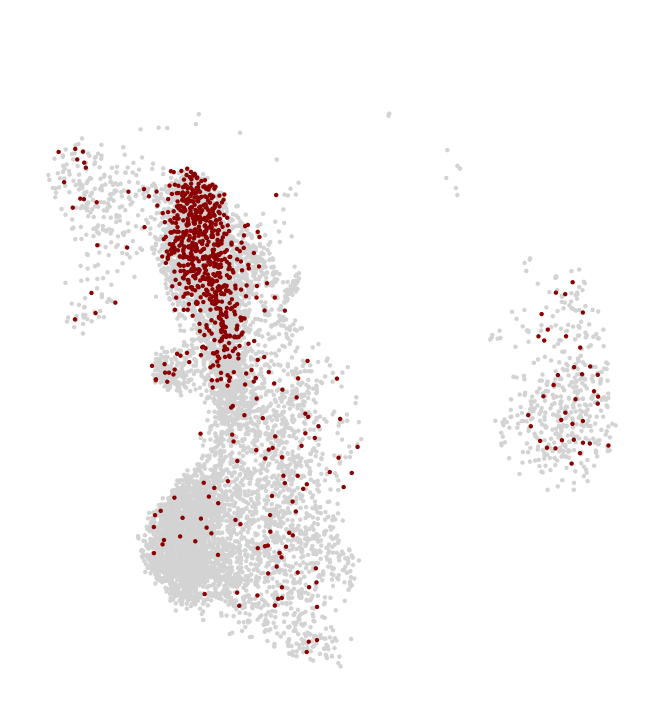

In [37]:
adata.obs["tc_expanded"] = 'No data'
cell_index_match = (adata.obs.index.str.slice(0, 16)).isin(all_tcr_tc_expanded_matched["cell-barcode"]);
ind_cov_match = (adata.obs.ind_cov).isin(all_tcr_tc_expanded_matched["ind_cov"])
batch_match = (adata.obs.batch_cov).isin(all_tcr_tc_expanded_matched["Sample_ID"])
adata.obs.loc[(cell_index_match & ind_cov_match & batch_match), "tc_expanded"] = 'Expanded'

cell_index_match = (adata.obs.index.str.slice(0, 16)).isin(all_tcr_tc_NOT_expanded_matched["cell-barcode"]);
ind_cov_match = (adata.obs.ind_cov).isin(all_tcr_tc_NOT_expanded_matched["ind_cov"])
batch_match = (adata.obs.batch_cov).isin(all_tcr_tc_NOT_expanded_matched["Sample_ID"])
adata.obs.loc[(cell_index_match & ind_cov_match & batch_match), "tc_expanded"] = 'Not Expanded'

adata.obs["th_expanded"] = 'No data'
cell_index_match = (adata.obs.index.str.slice(0, 16)).isin(all_tcr_th_expanded_matched["cell-barcode"]);
ind_cov_match = (adata.obs.ind_cov).isin(all_tcr_th_expanded_matched["ind_cov"])
batch_match = (adata.obs.batch_cov).isin(all_tcr_th_expanded_matched["Sample_ID"])
adata.obs.loc[(cell_index_match & ind_cov_match & batch_match), "th_expanded"] = 'Expanded'

cell_index_match = (adata.obs.index.str.slice(0, 16)).isin(all_tcr_th_NOT_expanded_matched["cell-barcode"]);
ind_cov_match = (adata.obs.ind_cov).isin(all_tcr_th_NOT_expanded_matched["ind_cov"])
batch_match = (adata.obs.batch_cov).isin(all_tcr_th_NOT_expanded_matched["Sample_ID"])
adata.obs.loc[(cell_index_match & ind_cov_match & batch_match), "th_expanded"] = 'Not Expanded'

adata.obs['tc_expanded'] = adata.obs['tc_expanded'].astype('category')
adata.obs['th_expanded'] = adata.obs['th_expanded'].astype('category')

tmp = adata[adata.obs['tc_expanded'].isin(['Not Expanded', 'Expanded'])]
sc.pl.umap(tmp[np.flipud(tmp.obs.tc_expanded.argsort())], color='tc_expanded', show=True, size=10, 
           edgecolor="none", save="_tcr_tc_expansion.png", 
           palette=["darkred", "lightgray"], title=" ", legend_loc=None)



RanksumsResult(statistic=2.8043408290327547, pvalue=0.005041957561690848)


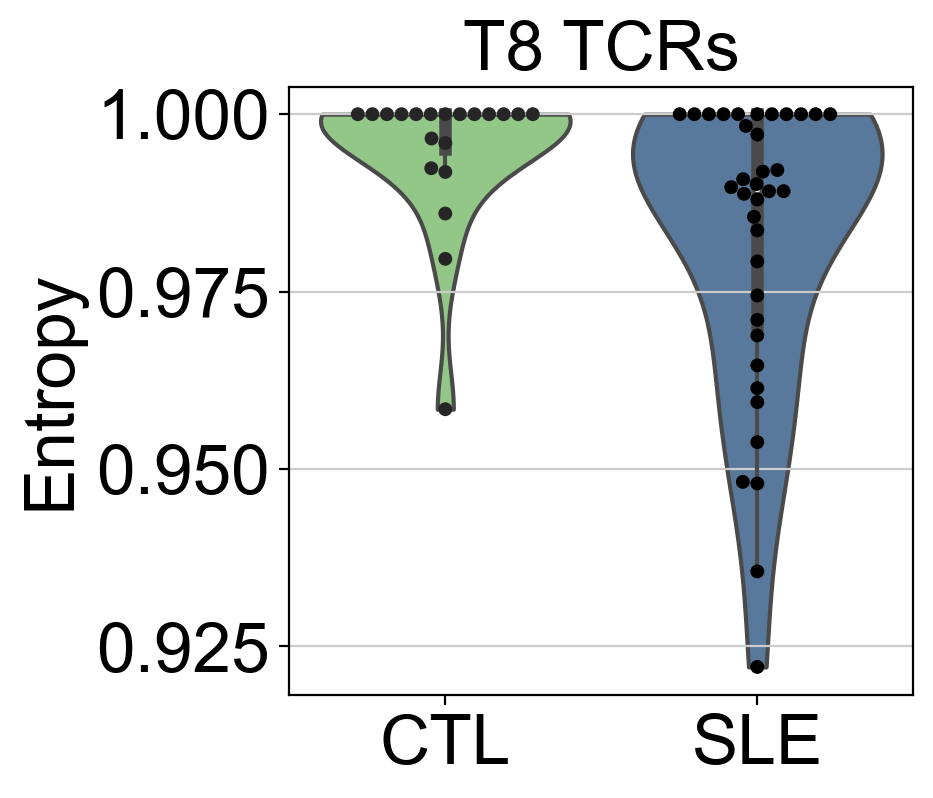

In [38]:
adata.obs['pop_cov_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['pop_cov'] + row['SLE_status'], axis=1), ordered=True)
def shannon(v, x):
    v = np.array(v)
    x = np.array(x)
    p = x / sum(v * x)
    return - sum(v * p * np.log(p))

from scipy.stats import entropy
people = tc_tcr['groups'].unique().tolist()
H = {}
for p in people:
    seq = tc_tcr[tc_tcr['groups']==p].reset_index()
    tcr_list = [np.repeat(seq['TCR'][ii], seq['total.cells'][ii]) for ii in range(len(seq))]
    tcr_list = [item for sublist in tcr_list for item in sublist]
    seq = pd.Series(tcr_list)
    ct = seq.value_counts()
    spt = ct.value_counts()
    H[p] = shannon(spt.values, spt.index)/np.log(len(seq))
H = pd.DataFrame.from_dict(H, orient='index', columns=['H'])

seq = tc_tcr[tc_tcr['groups']=='1046_1046'].reset_index()
tcr_list = [np.repeat(seq['TCR'][ii], seq['total.cells'][ii]) for ii in range(len(seq))]
tcr_list = [item for sublist in tcr_list for item in sublist]
seq = pd.Series(tcr_list)

cls = [adata.obs['SLE_status'][adata.obs['ind_cov']==p].unique()[0] for p in H.index.tolist()]
H['SLE_status'] = cls
cls = [adata.obs['pop_cov_SLE_status'][adata.obs['ind_cov']==p].unique()[0] for p in H.index.tolist()]
H['pop_cov_SLE_status'] = cls
cls = [adata.obs['Age'][adata.obs['ind_cov']==p].unique()[0] for p in H.index.tolist()]
H['Age'] = cls
H['Age'] = H['Age'].astype(float)
# Age match
H = H[(H['Age']>20) & (H['Age']<40)]

print(stats.ranksums(H[H['SLE_status']=='Healthy']['H'],H[H['SLE_status']=='SLE']['H']))

sns_plot = sns.violinplot(x='SLE_status', y='H', hue='SLE_status', order= ['Healthy', 'SLE'],
                          dodge=False, data=H, cut=0, palette=[colorrs[4], colorrs[0]])
sns.swarmplot(x='SLE_status', y='H', hue='SLE_status', data=H, order= ['Healthy', 'SLE'], color='k')
sns_plot.set_xticklabels(["CTL", "SLE",])
sns_plot.get_legend().remove()
plt.xlabel('')
plt.ylabel('Entropy')
plt.title('T8 TCRs')
sns_plot.figure.savefig(figdir+"/T8_TCR_Entropy.png", bbox_inches='tight')
sns_plot.figure.savefig(figdir+"/T8_TCR_Entropy.pdf", bbox_inches='tight')
